# Object Detection using TAO DetectNet_v2

Transfer learning is the process of transferring learned features from one application to another. It is a commonly used training technique where you use a model trained on one task and re-train to use it on a different task. 

Train Adapt Optimize (TAO) Toolkit  is a simple and easy-to-use Python based AI toolkit for taking purpose-built AI models and customizing them with users' own data.

<img align="center" src="https://developer.nvidia.com/sites/default/files/akamai/embedded-transfer-learning-toolkit-software-stack-1200x670px.png" width="1080"> 

## Learning Objectives
In this notebook, you will learn how to leverage the simplicity and convenience of TAO to:

* Take a pretrained resnet18 model and train a ResNet-18 DetectNet_v2 model on the KITTI dataset
* Prune the trained detectnet_v2 model
* Retrain the pruned model to recover lost accuracy
* Export the pruned model
* Quantize the pruned model using QAT
* Run Inference on the trained model
* Export the pruned, quantized and retrained model to a .etlt file for deployment to DeepStream
* Run inference on the exported. etlt model to verify deployment using TensorRT

### Table of Contents

This notebook shows an example usecase of Object Detection using DetectNet_v2 in the Train Adapt Optimize (TAO) Toolkit.

0. [Set up env variables and map drives](#head-0)
1. [Install the TAO Launcher](#head-1)
1. [Prepare dataset and pre-trained model](#head-2)
    1. [Download the dataset](#head-2-1)
    1. [Verify downloaded dataset](#head-2-2)
    1. [Prepare tfrecords from kitti format dataset](#head-2-3)
    2. [Download pre-trained model](#head-2-4)
2. [Provide training specification](#head-3)
3. [Run TAO training](#head-4)
4. [Evaluate trained models](#head-5)
5. [Prune trained models](#head-6)
6. [Retrain pruned models](#head-7)
7. [Evaluate retrained model](#head-8)
8. [Visualize inferences](#head-9)
9. [Model Export](#head-10)
    1. [Int8 Optimization](#head-10-1)
    2. [Generate TensorRT engine](#head-10-2)
10. [Verify Deployed Model](#head-11)
    1. [Inference using TensorRT engine](#head-11-1)
11. [QAT workflow](#head-12)
    1. [Convert pruned model to QAT and retrain](#head-12-1)
    2. [Evaluate QAT converted model](#head-12-2)
    3. [Export QAT trained model to int8](#head-12-3)
    4. [Evaluate a QAT trained model using the exported TensorRT engine](#head-12-4)
    5. [Inference using QAT engine](#head-12-5)

## 0. Set up env variables and map drives <a class="anchor" id="head-0"></a>
When using the purpose-built pretrained models from NGC, please make sure to set the `$KEY` environment variable to the key as mentioned in the model overview. Failing to do so, can lead to errors when trying to load them as pretrained models.

The following notebook requires the user to set an env variable called the `$LOCAL_PROJECT_DIR` as the path to the users workspace. Please note that the dataset to run this notebook is expected to reside in the `$LOCAL_PROJECT_DIR/data`, while the TAO experiment generated collaterals will be output to `$LOCAL_PROJECT_DIR/detectnet_v2`. More information on how to set up the dataset and the supported steps in the TAO workflow are provided in the subsequent cells.

*Note: Please make sure to remove any stray artifacts/files from the `$USER_EXPERIMENT_DIR` or `$DATA_DOWNLOAD_DIR` paths as mentioned below, that may have been generated from previous experiments. Having checkpoint files etc may interfere with creating a training graph for a new experiment.*

*Note: This notebook currently is by default set up to run training using 1 GPU. To use more GPU's please update the env variable `$NUM_GPUS` accordingly*

In [1]:
# Setting up env variables for cleaner command line commands.
import os

%env KEY=tlt_encode
%env NUM_GPUS=1
%env USER_EXPERIMENT_DIR=/workspace/tao-experiments/my_tao_cv_sample/myRaccoonWithDetectnetV2
%env DATA_DOWNLOAD_DIR=/workspace/tao-experiments/myData/myDetectnet

# Set this path if you don't run the notebook from the samples directory.
# %env NOTEBOOK_ROOT=~/tao-samples/detectnet_v2

# Please define this local project directory that needs to be mapped to the TAO docker session.
# The dataset expected to be present in $LOCAL_PROJECT_DIR/data, while the results for the steps
# in this notebook will be stored at $LOCAL_PROJECT_DIR/detectnet_v2
# !PLEASE MAKE SURE TO UPDATE THIS PATH!.

os.environ["LOCAL_PROJECT_DIR"] = "/home/demo/Desktop/workspace/cv_samples_v1.3.0"

os.environ["LOCAL_DATA_DIR"] = os.path.join(
    os.getenv("LOCAL_PROJECT_DIR", os.getcwd()),
    "myData", "myDetectnet"
)
os.environ["LOCAL_EXPERIMENT_DIR"] = os.path.join(
    os.getenv("LOCAL_PROJECT_DIR", os.getcwd()),
    "my_tao_cv_sample", "myRaccoonWithDetectnetV2"
)

# The sample spec files are present in the same path as the downloaded samples.
os.environ["LOCAL_SPECS_DIR"] = os.path.join(
    os.getenv("NOTEBOOK_ROOT", os.getcwd()),
    "specs"
)
%env SPECS_DIR=/workspace/tao-experiments/detectnet_v2/specs

# Showing list of specification files.
!ls -rlt $LOCAL_SPECS_DIR

env: KEY=tlt_encode
env: NUM_GPUS=1
env: USER_EXPERIMENT_DIR=/workspace/tao-experiments/my_tao_cv_sample/myRaccoonWithDetectnetV2
env: DATA_DOWNLOAD_DIR=/workspace/tao-experiments/myData/myDetectnet
env: SPECS_DIR=/workspace/tao-experiments/detectnet_v2/specs
total 32
-rw-rw-r-- 1 demo demo 2436  1월  4 15:37 detectnet_v2_inference_kitti_etlt.txt
-rw-rw-r-- 1 demo demo 5620  1월  4 15:37 detectnet_v2_retrain_resnet18_kitti_qat.txt
-rw-rw-r-- 1 demo demo 2445  1월  4 15:37 detectnet_v2_inference_kitti_etlt_qat.txt
-rw-rw-r-- 1 demo demo  329  1월 10 16:39 detectnet_v2_tfrecords_kitti_trainval.txt
-rw-rw-r-- 1 demo demo 1443  1월 10 17:40 detectnet_v2_inference_kitti_tlt.txt
-rw-rw-r-- 1 demo demo 3101  1월 11 09:34 detectnet_v2_train_resnet18_kitti.txt
-rw-rw-r-- 1 demo demo 3120  1월 11 09:34 detectnet_v2_retrain_resnet18_kitti.txt


The cell below maps the project directory on your local host to a workspace directory in the TAO docker instance, so that the data and the results are mapped from in and out of the docker. For more information please refer to the [launcher instance](https://docs.nvidia.com/tao/tao-toolkit/tao_launcher.html) in the user guide.

When running this cell on AWS, update the drive_map entry with the dictionary defined below, so that you don't have permission issues when writing data into folders created by the TAO docker.

```json
drive_map = {
    "Mounts": [
            # Mapping the data directory
            {
                "source": os.environ["LOCAL_PROJECT_DIR"],
                "destination": "/workspace/tao-experiments"
            },
            # Mapping the specs directory.
            {
                "source": os.environ["LOCAL_SPECS_DIR"],
                "destination": os.environ["SPECS_DIR"]
            },
        ],
    "DockerOptions": {
        "user": "{}:{}".format(os.getuid(), os.getgid())
    }
}
```

In [2]:
# Mapping up the local directories to the TAO docker.
import json
mounts_file = os.path.expanduser("~/.tao_mounts.json")

# Define the dictionary with the mapped drives
drive_map = {
    "Mounts": [
        # Mapping the data directory
        {
            "source": os.environ["LOCAL_PROJECT_DIR"],
            "destination": "/workspace/tao-experiments"
        },
        # Mapping the specs directory.
        {
            "source": os.environ["LOCAL_SPECS_DIR"],
            "destination": os.environ["SPECS_DIR"]
        },
    ]
}

# Writing the mounts file.
with open(mounts_file, "w") as mfile:
    json.dump(drive_map, mfile, indent=4)

In [3]:
!cat ~/.tao_mounts.json

{
    "Mounts": [
        {
            "source": "/home/demo/Desktop/workspace/cv_samples_v1.3.0",
            "destination": "/workspace/tao-experiments"
        },
        {
            "source": "/home/demo/Desktop/workspace/cv_samples_v1.3.0/my_tao_cv_sample/myRaccoonWithDetectnetV2/specs",
            "destination": "/workspace/tao-experiments/detectnet_v2/specs"
        }
    ]
}

## 1. Install the TAO launcher <a class="anchor" id="head-1"></a>
The TAO launcher is a python package distributed as a python wheel listed in the `nvidia-pyindex` python index. You may install the launcher by executing the following cell.

Please note that TAO Toolkit recommends users to run the TAO launcher in a virtual env with python 3.6.9. You may follow the instruction in this [page](https://virtualenvwrapper.readthedocs.io/en/latest/install.html) to set up a python virtual env using the `virtualenv` and `virtualenvwrapper` packages. Once you have setup virtualenvwrapper, please set the version of python to be used in the virtual env by using the `VIRTUALENVWRAPPER_PYTHON` variable. You may do so by running

```sh
export VIRTUALENVWRAPPER_PYTHON=/path/to/bin/python3.x
```
where x >= 6 and <= 8

We recommend performing this step first and then launching the notebook from the virtual environment. In addition to installing TAO python package, please make sure of the following software requirements:
* python >=3.6.9 < 3.8.x
* docker-ce > 19.03.5
* docker-API 1.40
* nvidia-container-toolkit > 1.3.0-1
* nvidia-container-runtime > 3.4.0-1
* nvidia-docker2 > 2.5.0-1
* nvidia-driver > 455+

Once you have installed the pre-requisites, please log in to the docker registry nvcr.io by following the command below

```sh
docker login nvcr.io
```

You will be triggered to enter a username and password. The username is `$oauthtoken` and the password is the API key generated from `ngc.nvidia.com`. Please follow the instructions in the [NGC setup guide](https://docs.nvidia.com/ngc/ngc-overview/index.html#generating-api-key) to generate your own API key.

In [4]:
# SKIP this step IF you have already installed the TAO launcher wheel.
!pip3 install nvidia-pyindex
!pip3 install nvidia-tao

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com


In [5]:
# View the versions of the TAO launcher
!tao info

Configuration of the TAO Toolkit Instance
dockers: ['nvidia/tao/tao-toolkit-tf', 'nvidia/tao/tao-toolkit-pyt', 'nvidia/tao/tao-toolkit-lm']
format_version: 2.0
toolkit_version: 3.21.11
published_date: 11/08/2021


## 2. Prepare dataset and pre-trained model <a class="anchor" id="head-2"></a>

이 예에서는 COCO 라쿤 데이터셋 kitti 형식으로 변환해서 사용할 것입니다.

The data will then be extracted to have
* training images in `$LOCAL_DATA_DIR/train/image`
* training labels in `$LOCAL_DATA_DIR/train/labels`
* testing images in `$LOCAL_DATA_DIR/test/image`

You may use this notebook with your own dataset as well. To use this example with your own dataset, please follow the same directory structure as mentioned below.

*Note: There are no labels for the testing images, therefore we use it just to visualize inferences for the trained model.*

In [6]:
# verify
import os

DATA_DIR = os.environ.get('LOCAL_DATA_DIR')
num_training_images = len(os.listdir(os.path.join(DATA_DIR, "train/image")))
num_training_labels = len(os.listdir(os.path.join(DATA_DIR, "train/labels")))
num_testing_images = len(os.listdir(os.path.join(DATA_DIR, "test/image")))
print("Number of images in the train/val set. {}".format(num_training_images))
print("Number of labels in the train/val set. {}".format(num_training_labels))
print("Number of images in the test set. {}".format(num_testing_images))

Number of images in the train/val set. 150
Number of labels in the train/val set. 150
Number of images in the test set. 17


In [7]:
# Sample kitti label.
!cat $LOCAL_DATA_DIR/train/labels/raccoon-5_jpg.rf.ed3b48126c85d184cf0161e1c8c268ad.txt

raccoon 0 0 0 3 3 260 179 0 0 0 0 0 0 0


### C. Prepare tf records from kitti format dataset <a class="anchor" id="head-2-3"></a>

* Update the tfrecords spec file to take in your kitti format dataset
* Create the tfrecords using the detectnet_v2 dataset_convert 

*Note: TfRecords only need to be generated once.*

In [8]:
print("TFrecords conversion spec file for kitti training")
!cat $LOCAL_SPECS_DIR/detectnet_v2_tfrecords_kitti_trainval.txt

TFrecords conversion spec file for kitti training
kitti_config {
  root_directory_path: "/workspace/tao-experiments/myData/myDetectnet/train"
  image_dir_name: "image"
  label_dir_name: "labels"
  image_extension: ".jpg"
  partition_mode: "random"
  num_partitions: 2
  val_split: 14
  num_shards: 10
}
image_directory_path: "/workspace/tao-experiments/myData/myDetectnet/train"


In [9]:
!echo $LOCAL_DATA_DIR
!echo $DATA_DIR
!echo $USER_EXPERIMENT_DIR
!echo $DATA_DOWNLOAD_DIR

#FileNotFoundError: [Errno 2] No such file or directory: '/workspace/tao-experiments/data/training/image_2'

/home/demo/Desktop/workspace/cv_samples_v1.3.0/myData/myDetectnet
/home/demo/Desktop/workspace/cv_samples_v1.3.0/myData/myDetectnet
/workspace/tao-experiments/my_tao_cv_sample/myRaccoonWithDetectnetV2
/workspace/tao-experiments/myData/myDetectnet


In [10]:
# Creating a new directory for the output tfrecords dump.
print("Converting Tfrecords for kitti trainval dataset")
!mkdir -p $LOCAL_DATA_DIR/tfrecords && rm -rf $LOCAL_DATA_DIR/tfrecords/*
!tao detectnet_v2 dataset_convert \
                  -d $SPECS_DIR/detectnet_v2_tfrecords_kitti_trainval.txt \
                  -o $DATA_DOWNLOAD_DIR/tfrecords/trainval/trainval

Converting Tfrecords for kitti trainval dataset
rm: cannot remove '/home/demo/Desktop/workspace/cv_samples_v1.3.0/myData/myDetectnet/tfrecords/trainval/trainval-fold-000-of-002-shard-00008-of-00010': Permission denied
rm: cannot remove '/home/demo/Desktop/workspace/cv_samples_v1.3.0/myData/myDetectnet/tfrecords/trainval/trainval-fold-000-of-002-shard-00000-of-00010': Permission denied
rm: cannot remove '/home/demo/Desktop/workspace/cv_samples_v1.3.0/myData/myDetectnet/tfrecords/trainval/trainval-fold-000-of-002-shard-00001-of-00010': Permission denied
rm: cannot remove '/home/demo/Desktop/workspace/cv_samples_v1.3.0/myData/myDetectnet/tfrecords/trainval/trainval-fold-001-of-002-shard-00006-of-00010': Permission denied
rm: cannot remove '/home/demo/Desktop/workspace/cv_samples_v1.3.0/myData/myDetectnet/tfrecords/trainval/trainval-fold-000-of-002-shard-00003-of-00010': Permission denied
rm: cannot remove '/home/demo/Desktop/workspace/cv_samples_v1.3.0/myData/myDetectnet/tfrecords/trainva

2022-01-11 00:38:55,793 [INFO] iva.detectnet_v2.dataio.dataset_converter_lib: Writing partition 1, shard 4
2022-01-11 00:38:55,793 [INFO] root: Writing partition 1, shard 4
2022-01-11 00:38:55,801 [INFO] iva.detectnet_v2.dataio.dataset_converter_lib: Writing partition 1, shard 5
2022-01-11 00:38:55,801 [INFO] root: Writing partition 1, shard 5
2022-01-11 00:38:55,808 [INFO] iva.detectnet_v2.dataio.dataset_converter_lib: Writing partition 1, shard 6
2022-01-11 00:38:55,808 [INFO] root: Writing partition 1, shard 6
2022-01-11 00:38:55,815 [INFO] iva.detectnet_v2.dataio.dataset_converter_lib: Writing partition 1, shard 7
2022-01-11 00:38:55,815 [INFO] root: Writing partition 1, shard 7
2022-01-11 00:38:55,822 [INFO] iva.detectnet_v2.dataio.dataset_converter_lib: Writing partition 1, shard 8
2022-01-11 00:38:55,822 [INFO] root: Writing partition 1, shard 8
2022-01-11 00:38:55,830 [INFO] iva.detectnet_v2.dataio.dataset_converter_lib: Writing partition 1, shard 9
2022-01-11 00:38:55,830 [INF

In [11]:
!ls -rlt $LOCAL_DATA_DIR/tfrecords/trainval/

total 128
-rw-r--r-- 1 root root  1296  1월 11 09:38 trainval-fold-000-of-002-shard-00000-of-00010
-rw-r--r-- 1 root root  1295  1월 11 09:38 trainval-fold-000-of-002-shard-00002-of-00010
-rw-r--r-- 1 root root  1296  1월 11 09:38 trainval-fold-000-of-002-shard-00001-of-00010
-rw-r--r-- 1 root root  1294  1월 11 09:38 trainval-fold-000-of-002-shard-00005-of-00010
-rw-r--r-- 1 root root  1357  1월 11 09:38 trainval-fold-000-of-002-shard-00004-of-00010
-rw-r--r-- 1 root root  1296  1월 11 09:38 trainval-fold-000-of-002-shard-00003-of-00010
-rw-r--r-- 1 root root  1296  1월 11 09:38 trainval-fold-000-of-002-shard-00006-of-00010
-rw-r--r-- 1 root root  1296  1월 11 09:38 trainval-fold-000-of-002-shard-00007-of-00010
-rw-r--r-- 1 root root  2004  1월 11 09:38 trainval-fold-000-of-002-shard-00009-of-00010
-rw-r--r-- 1 root root  1294  1월 11 09:38 trainval-fold-000-of-002-shard-00008-of-00010
-rw-r--r-- 1 root root  7773  1월 11 09:38 trainval-fold-001-of-002-shard-00000-of-00010
-rw-r--r-- 1 root root

### D. Download pre-trained model <a class="anchor" id="head-2-4"></a>
Download the correct pretrained model from the NGC model registry for your experiment. Please note that for DetectNet_v2, the input is expected to be 0-1 normalized with input channels in RGB order. Therefore, for optimum results please download model templates from `nvidia/tao/pretrained_detectnet_v2`. The templates are now organized as version strings. For example, to download a resnet18 model suitable for detectnet please resolve to the ngc object shown as `nvidia/tao/pretrained_detectnet_v2:resnet18`. 

All other models are in BGR order expect input preprocessing with mean subtraction and input channels. Using them as pretrained weights may result in suboptimal performance.

You may also use this notebook with the following purpose-built pretrained models 
* [PeopleNet](https://ngc.nvidia.com/catalog/models/nvidia:tao:peoplenet)
* [TrafficCamNet](https://ngc.nvidia.com/catalog/models/nvidia:tao:trafficcamnet)
* [DashCamNet](https://ngc.nvidia.com/catalog/models/nvidia:tao:dashcamnet)
* [FaceDetect-IR](https://ngc.nvidia.com/catalog/models/nvidia:tao:facedetectir) 

In [12]:
# Installing NGC CLI on the local machine.
## Download and install
%env CLI=ngccli_cat_linux.zip
!mkdir -p $LOCAL_PROJECT_DIR/ngccli

# Remove any previously existing CLI installations
!rm -rf $LOCAL_PROJECT_DIR/ngccli/*
!wget "https://ngc.nvidia.com/downloads/$CLI" -P $LOCAL_PROJECT_DIR/ngccli
!unzip -u "$LOCAL_PROJECT_DIR/ngccli/$CLI" -d $LOCAL_PROJECT_DIR/ngccli/
!rm $LOCAL_PROJECT_DIR/ngccli/*.zip 
os.environ["PATH"]="{}/ngccli:{}".format(os.getenv("LOCAL_PROJECT_DIR", ""), os.getenv("PATH", ""))

env: CLI=ngccli_cat_linux.zip
--2022-01-11 09:39:07--  https://ngc.nvidia.com/downloads/ngccli_cat_linux.zip
Resolving ngc.nvidia.com (ngc.nvidia.com)... 99.86.202.2, 99.86.202.63, 99.86.202.18, ...
Connecting to ngc.nvidia.com (ngc.nvidia.com)|99.86.202.2|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 25122952 (24M) [application/zip]
Saving to: ‘/home/demo/Desktop/workspace/cv_samples_v1.3.0/ngccli/ngccli_cat_linux.zip’

ngccli_cat_linux.zi 100%[===================>]  23.96M  11.1MB/s    in 2.1s    

2022-01-11 09:39:09 (11.1 MB/s) - ‘/home/demo/Desktop/workspace/cv_samples_v1.3.0/ngccli/ngccli_cat_linux.zip’ saved [25122952/25122952]

Archive:  /home/demo/Desktop/workspace/cv_samples_v1.3.0/ngccli/ngccli_cat_linux.zip
  inflating: /home/demo/Desktop/workspace/cv_samples_v1.3.0/ngccli/ngc  
 extracting: /home/demo/Desktop/workspace/cv_samples_v1.3.0/ngccli/ngc.md5  


In [13]:
# List models available in the model registry.
!ngc registry model list nvidia/tao/pretrained_detectnet_v2:*

+-------+-------+-------+-------+-------+-------+-------+-------+-------+
| Versi | Accur | Epoch | Batch | GPU   | Memor | File  | Statu | Creat |
| on    | acy   | s     | Size  | Model | y Foo | Size  | s     | ed    |
|       |       |       |       |       | tprin |       |       | Date  |
|       |       |       |       |       | t     |       |       |       |
+-------+-------+-------+-------+-------+-------+-------+-------+-------+
| vgg19 | 82.6  | 80    | 1     | V100  | 153.8 | 153.7 | UPLOA | Aug   |
|       |       |       |       |       |       | 7 MB  | D_COM | 24,   |
|       |       |       |       |       |       |       | PLETE | 2021  |
| vgg16 | 82.2  | 80    | 1     | V100  | 113.2 | 113.2 | UPLOA | Aug   |
|       |       |       |       |       |       | MB    | D_COM | 24,   |
|       |       |       |       |       |       |       | PLETE | 2021  |
| squee | 65.67 | 80    | 1     | V100  | 6.5   | 6.46  | UPLOA | Aug   |
| zenet |       |       |       |     

In [14]:
# Create the target destination to download the model.
!mkdir -p $LOCAL_EXPERIMENT_DIR/pretrained_resnet18/

In [15]:
# Download the pretrained model from NGC
!ngc registry model download-version nvidia/tao/pretrained_detectnet_v2:resnet18 \
    --dest $LOCAL_EXPERIMENT_DIR/pretrained_resnet18

Downloaded 82.28 MB in 2m 38s, Download speed: 532.68 KB/s               
----------------------------------------------------
Transfer id: pretrained_detectnet_v2_vresnet18 Download status: Completed.
Downloaded local path: /home/demo/Desktop/workspace/cv_samples_v1.3.0/my_tao_cv_sample/myRaccoonWithDetectnetV2/pretrained_resnet18/pretrained_detectnet_v2_vresnet18
Total files downloaded: 1 
Total downloaded size: 82.28 MB
Started at: 2022-01-11 09:39:18.126931
Completed at: 2022-01-11 09:41:56.294990
Duration taken: 2m 38s
----------------------------------------------------


In [16]:
!ls -rlt $LOCAL_EXPERIMENT_DIR/pretrained_resnet18/pretrained_detectnet_v2_vresnet18

total 91160
-rw------- 1 demo demo 93345248  1월 11 09:41 resnet18.hdf5


## 3. Provide training specification <a class="anchor" id="head-3"></a>
* Tfrecords for the train datasets
    * To use the newly generated tfrecords, update the dataset_config parameter in the spec file at `$SPECS_DIR/detectnet_v2_train_resnet18_kitti.txt` 
    * Update the fold number to use for evaluation. In case of random data split, please use fold `0` only
    * For sequence-wise split, you may use any fold generated from the dataset convert tool
* Pre-trained models
* Augmentation parameters for on the fly data augmentation
* Other training (hyper-)parameters such as batch size, number of epochs, learning rate etc.

In [17]:
!cat $LOCAL_SPECS_DIR/detectnet_v2_train_resnet18_kitti.txt

random_seed: 42
dataset_config {
  data_sources {
    tfrecords_path: "/workspace/tao-experiments/myData/myDetectnet/tfrecords/trainval/*"
    image_directory_path: "/workspace/tao-experiments/myData/myDetectnet/train"
  }
  image_extension: "jpg"
  target_class_mapping {
    key: "raccoon"
    value: "raccoon"
  }
  validation_fold: 0
}
augmentation_config {
  preprocessing {
    output_image_width: 1248
    output_image_height: 384
    min_bbox_width: 1.0
    min_bbox_height: 1.0
    output_image_channel: 3
  }
  spatial_augmentation {
    hflip_probability: 0.5
    zoom_min: 1.0
    zoom_max: 1.0
    translate_max_x: 8.0
    translate_max_y: 8.0
  }
  color_augmentation {
    hue_rotation_max: 25.0
    saturation_shift_max: 0.20000000298
    contrast_scale_max: 0.10000000149
    contrast_center: 0.5
  }
}
postprocessing_config {
  target_class_config {
    key: "raccoon"
    value {
      clustering_config {
        clustering_algorithm: DBSCAN
        dbscan_confidence_threshold: 0

## 4. Run TAO training <a class="anchor" id="head-4"></a>
* Provide the sample spec file and the output directory location for models

*Note: The training may take hours to complete. Also, the remaining notebook, assumes that the training was done in single-GPU mode. When run in multi-GPU mode, please expect to update the pruning and inference steps with new pruning thresholds and updated parameters in the clusterfile.json accordingly for optimum performance.*

*Detectnet_v2 now supports restart from checkpoint. In case the training job is killed prematurely, you may resume training from the closest checkpoint by simply re-running the **same** command line. Please do make sure to use the <u>**same number of GPUs**</u> when restarting the training.*

*When running the training with NUM_GPUs>1, you may need to modify the `batch_size_per_gpu` and `learning_rate` to get similar mAP as a 1GPU training run. In most cases, scaling down the batch-size by a factor of NUM_GPU's or scaling up the learning rate by a factor of NUM_GPU's would be a good place to start.* 

In [18]:
!tao detectnet_v2 train -e $SPECS_DIR/detectnet_v2_train_resnet18_kitti.txt \
                        -r $USER_EXPERIMENT_DIR/experiment_dir_unpruned \
                        -k $KEY \
                        -n resnet18_detector \
                        --gpus $NUM_GPUS

2022-01-11 09:41:58,266 [INFO] root: Registry: ['nvcr.io']
2022-01-11 09:41:58,308 [INFO] tlt.components.instance_handler.local_instance: Running command in container: nvcr.io/nvidia/tao/tao-toolkit-tf:v3.21.11-tf1.15.4-py3
2022-01-11 09:41:58,332 [WARNING] tlt.components.docker_handler.docker_handler: 
Docker will run the commands as root. If you would like to retain your
local host permissions, please add the "user":"UID:GID" in the
DockerOptions portion of the "/home/demo/.tao_mounts.json" file. You can obtain your
users UID and GID by using the "id -u" and "id -g" commands on the
terminal.
Using TensorFlow backend.
Using TensorFlow backend.

2022-01-11 00:42:03,004 [WARNING] tensorflow: From /opt/tlt/.cache/dazel/_dazel_tlt/75913d2aee35770fa76c4a63d877f3aa/execroot/ai_infra/bazel-out/k8-fastbuild/bin/magnet/packages/iva/build_wheel.runfiles/ai_infra/iva/detectnet_v2/cost_function/cost_auto_weight_hook.py:43: The name tf.train.SessionRunHook is deprecated. Please use tf.estimator.Se


2022-01-11 00:42:04,615 [WARNING] tensorflow: From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:174: The name tf.get_default_session is deprecated. Please use tf.compat.v1.get_default_session instead.


2022-01-11 00:42:04,616 [WARNING] tensorflow: From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:199: The name tf.is_variable_initialized is deprecated. Please use tf.compat.v1.is_variable_initialized instead.


2022-01-11 00:42:04,850 [WARNING] tensorflow: From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:206: The name tf.variables_initializer is deprecated. Please use tf.compat.v1.variables_initializer instead.

2022-01-11 00:42:10,029 [INFO] iva.detectnet_v2.objectives.bbox_objective: Default L1 loss function will be used.
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected t

2022-01-11 00:42:10,120 [WARNING] tensorflow: Entity <bound method DriveNetTFRecordsParser.__call__ of <iva.detectnet_v2.dataloader.drivenet_dataloader.DriveNetTFRecordsParser object at 0x7faff14704e0>> could not be transformed and will be executed as-is. Please report this to the AutoGraph team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output. Cause: Unable to locate the source code of <bound method DriveNetTFRecordsParser.__call__ of <iva.detectnet_v2.dataloader.drivenet_dataloader.DriveNetTFRecordsParser object at 0x7faff14704e0>>. Note that functions defined in certain environments, like the interactive Python shell do not expose their source code. If that is the case, you should to define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.do_not_convert. Original error: could not get source code
2022-01-11 00:42:10,135 [INFO] iva.detectnet_v2.dataloader.de

2022-01-11 00:42:12,038 [INFO] modulus.blocks.data_loaders.multi_source_loader.data_loader: Serial augmentation enabled = False
2022-01-11 00:42:12,038 [INFO] modulus.blocks.data_loaders.multi_source_loader.data_loader: Pseudo sharding enabled = False
2022-01-11 00:42:12,038 [INFO] modulus.blocks.data_loaders.multi_source_loader.data_loader: Max Image Dimensions (all sources): (0, 0)
2022-01-11 00:42:12,038 [INFO] modulus.blocks.data_loaders.multi_source_loader.data_loader: number of cpus: 16, io threads: 32, compute threads: 16, buffered batches: 4
2022-01-11 00:42:12,038 [INFO] modulus.blocks.data_loaders.multi_source_loader.data_loader: total dataset size 21, number of sources: 1, batch size per gpu: 4, steps: 6
2022-01-11 00:42:12,046 [WARNING] tensorflow: Entity <bound method DriveNetTFRecordsParser.__call__ of <iva.detectnet_v2.dataloader.drivenet_dataloader.DriveNetTFRecordsParser object at 0x7faff1470630>> could not be transformed and will be executed as-is. Please report this 

INFO:tensorflow:Graph was finalized.
2022-01-11 00:42:14,383 [INFO] tensorflow: Graph was finalized.
INFO:tensorflow:Running local_init_op.
2022-01-11 00:42:15,647 [INFO] tensorflow: Running local_init_op.
INFO:tensorflow:Done running local_init_op.
2022-01-11 00:42:16,078 [INFO] tensorflow: Done running local_init_op.
INFO:tensorflow:Saving checkpoints for step-0.
2022-01-11 00:42:20,633 [INFO] tensorflow: Saving checkpoints for step-0.
INFO:tensorflow:epoch = 0.0, learning_rate = 4.9999994e-06, loss = 0.06900308, step = 0
2022-01-11 00:42:34,840 [INFO] tensorflow: epoch = 0.0, learning_rate = 4.9999994e-06, loss = 0.06900308, step = 0
2022-01-11 00:42:34,842 [INFO] iva.detectnet_v2.tfhooks.task_progress_monitor_hook: Epoch 0/120: loss: 0.06900 learning rate: 0.00000 Time taken: 0:00:00 ETA: 0:00:00
2022-01-11 00:42:34,842 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 0.977
INFO:tensorflow:global_step/sec: 2.09904
2022-01-11 00:42:36,270 [INFO] tensorflow: global_step

INFO:tensorflow:global_step/sec: 9.45921
2022-01-11 00:42:45,318 [INFO] tensorflow: global_step/sec: 9.45921
INFO:tensorflow:global_step/sec: 9.47187
2022-01-11 00:42:45,634 [INFO] tensorflow: global_step/sec: 9.47187
INFO:tensorflow:global_step/sec: 9.0697
2022-01-11 00:42:45,965 [INFO] tensorflow: global_step/sec: 9.0697
INFO:tensorflow:global_step/sec: 9.13487
2022-01-11 00:42:46,294 [INFO] tensorflow: global_step/sec: 9.13487
INFO:tensorflow:global_step/sec: 9.18255
2022-01-11 00:42:46,620 [INFO] tensorflow: global_step/sec: 9.18255
2022-01-11 00:42:46,621 [INFO] iva.detectnet_v2.tfhooks.task_progress_monitor_hook: Epoch 3/120: loss: 0.00287 learning rate: 0.00002 Time taken: 0:00:03.520488 ETA: 0:06:51.897099
2022-01-11 00:42:46,621 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 37.419
INFO:tensorflow:global_step/sec: 9.02497
2022-01-11 00:42:46,953 [INFO] tensorflow: global_step/sec: 9.02497
INFO:tensorflow:global_step/sec: 9.29949
2022-01-11 00:42:47,275 [INFO] t

INFO:tensorflow:global_step/sec: 9.48995
2022-01-11 00:43:03,172 [INFO] tensorflow: global_step/sec: 9.48995
INFO:tensorflow:global_step/sec: 9.28078
2022-01-11 00:43:03,496 [INFO] tensorflow: global_step/sec: 9.28078
INFO:tensorflow:global_step/sec: 9.41406
2022-01-11 00:43:03,814 [INFO] tensorflow: global_step/sec: 9.41406
INFO:tensorflow:global_step/sec: 9.41002
2022-01-11 00:43:04,133 [INFO] tensorflow: global_step/sec: 9.41002
INFO:tensorflow:global_step/sec: 9.24985
2022-01-11 00:43:04,457 [INFO] tensorflow: global_step/sec: 9.24985
2022-01-11 00:43:04,458 [INFO] iva.detectnet_v2.tfhooks.task_progress_monitor_hook: Epoch 8/120: loss: 0.00146 learning rate: 0.00011 Time taken: 0:00:03.489764 ETA: 0:06:30.853539
INFO:tensorflow:global_step/sec: 9.52621
2022-01-11 00:43:04,772 [INFO] tensorflow: global_step/sec: 9.52621
INFO:tensorflow:global_step/sec: 9.45686
2022-01-11 00:43:05,090 [INFO] tensorflow: global_step/sec: 9.45686
INFO:tensorflow:global_step/sec: 9.53458
2022-01-11 00:4

INFO:tensorflow:global_step/sec: 9.22077
2022-01-11 00:43:21,830 [INFO] tensorflow: global_step/sec: 9.22077
INFO:tensorflow:global_step/sec: 9.20249
2022-01-11 00:43:22,156 [INFO] tensorflow: global_step/sec: 9.20249
INFO:tensorflow:global_step/sec: 9.20195
2022-01-11 00:43:22,482 [INFO] tensorflow: global_step/sec: 9.20195
INFO:tensorflow:global_step/sec: 9.19656
2022-01-11 00:43:22,808 [INFO] tensorflow: global_step/sec: 9.19656
INFO:tensorflow:global_step/sec: 9.20875
2022-01-11 00:43:23,134 [INFO] tensorflow: global_step/sec: 9.20875
INFO:tensorflow:global_step/sec: 9.17842
2022-01-11 00:43:23,461 [INFO] tensorflow: global_step/sec: 9.17842
INFO:tensorflow:global_step/sec: 9.10839
2022-01-11 00:43:23,790 [INFO] tensorflow: global_step/sec: 9.10839
2022-01-11 00:43:23,899 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 36.755
INFO:tensorflow:global_step/sec: 9.09039
2022-01-11 00:43:24,120 [INFO] tensorflow: global_step/sec: 9.09039
INFO:tensorflow:global_step/sec: 9

INFO:tensorflow:global_step/sec: 9.44794
2022-01-11 00:43:39,332 [INFO] tensorflow: global_step/sec: 9.44794
INFO:tensorflow:global_step/sec: 9.5281
2022-01-11 00:43:39,647 [INFO] tensorflow: global_step/sec: 9.5281
2022-01-11 00:43:39,753 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 37.926
INFO:tensorflow:global_step/sec: 9.36472
2022-01-11 00:43:39,967 [INFO] tensorflow: global_step/sec: 9.36472
INFO:tensorflow:global_step/sec: 9.5755
2022-01-11 00:43:40,280 [INFO] tensorflow: global_step/sec: 9.5755
INFO:tensorflow:global_step/sec: 9.51889
2022-01-11 00:43:40,596 [INFO] tensorflow: global_step/sec: 9.51889
INFO:tensorflow:global_step/sec: 9.55558
2022-01-11 00:43:40,910 [INFO] tensorflow: global_step/sec: 9.55558
INFO:tensorflow:global_step/sec: 9.39508
2022-01-11 00:43:41,229 [INFO] tensorflow: global_step/sec: 9.39508
INFO:tensorflow:global_step/sec: 9.5497
2022-01-11 00:43:41,543 [INFO] tensorflow: global_step/sec: 9.5497
INFO:tensorflow:global_step/sec: 9.46335

INFO:tensorflow:global_step/sec: 9.09033
2022-01-11 00:43:58,453 [INFO] tensorflow: global_step/sec: 9.09033
2022-01-11 00:43:58,453 [INFO] iva.detectnet_v2.tfhooks.task_progress_monitor_hook: Epoch 22/120: loss: 0.00107 learning rate: 0.00050 Time taken: 0:00:03.577760 ETA: 0:05:50.620502
INFO:tensorflow:global_step/sec: 9.41561
2022-01-11 00:43:58,771 [INFO] tensorflow: global_step/sec: 9.41561
INFO:tensorflow:global_step/sec: 9.46289
2022-01-11 00:43:59,088 [INFO] tensorflow: global_step/sec: 9.46289
INFO:tensorflow:global_step/sec: 9.50698
2022-01-11 00:43:59,404 [INFO] tensorflow: global_step/sec: 9.50698
INFO:tensorflow:global_step/sec: 9.45189
2022-01-11 00:43:59,721 [INFO] tensorflow: global_step/sec: 9.45189
INFO:tensorflow:global_step/sec: 9.36594
2022-01-11 00:44:00,042 [INFO] tensorflow: global_step/sec: 9.36594
INFO:tensorflow:global_step/sec: 9.57111
2022-01-11 00:44:00,355 [INFO] tensorflow: global_step/sec: 9.57111
INFO:tensorflow:global_step/sec: 9.39743
2022-01-11 00:

INFO:tensorflow:global_step/sec: 9.26181
2022-01-11 00:44:15,950 [INFO] tensorflow: global_step/sec: 9.26181
2022-01-11 00:44:15,950 [INFO] iva.detectnet_v2.tfhooks.task_progress_monitor_hook: Epoch 27/120: loss: 0.00122 learning rate: 0.00050 Time taken: 0:00:03.488111 ETA: 0:05:24.394303
INFO:tensorflow:global_step/sec: 9.49001
2022-01-11 00:44:16,266 [INFO] tensorflow: global_step/sec: 9.49001
INFO:tensorflow:global_step/sec: 9.42231
2022-01-11 00:44:16,584 [INFO] tensorflow: global_step/sec: 9.42231
2022-01-11 00:44:16,796 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 37.801
INFO:tensorflow:global_step/sec: 9.43984
2022-01-11 00:44:16,902 [INFO] tensorflow: global_step/sec: 9.43984
INFO:tensorflow:global_step/sec: 9.49877
2022-01-11 00:44:17,218 [INFO] tensorflow: global_step/sec: 9.49877
INFO:tensorflow:global_step/sec: 9.53217
2022-01-11 00:44:17,533 [INFO] tensorflow: global_step/sec: 9.53217
INFO:tensorflow:global_step/sec: 9.40404
2022-01-11 00:44:17,852 [INFO

INFO:tensorflow:epoch = 31.484848484848484, learning_rate = 0.00049999997, loss = 0.0010802593, step = 1039 (5.169 sec)
2022-01-11 00:44:35,065 [INFO] tensorflow: epoch = 31.484848484848484, learning_rate = 0.00049999997, loss = 0.0010802593, step = 1039 (5.169 sec)
INFO:tensorflow:global_step/sec: 9.30255
2022-01-11 00:44:35,279 [INFO] tensorflow: global_step/sec: 9.30255
INFO:tensorflow:global_step/sec: 9.48011
2022-01-11 00:44:35,595 [INFO] tensorflow: global_step/sec: 9.48011
INFO:tensorflow:global_step/sec: 9.35352
2022-01-11 00:44:35,916 [INFO] tensorflow: global_step/sec: 9.35352
2022-01-11 00:44:36,128 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 37.839
INFO:tensorflow:global_step/sec: 9.40026
2022-01-11 00:44:36,235 [INFO] tensorflow: global_step/sec: 9.40026
INFO:tensorflow:global_step/sec: 9.49895
2022-01-11 00:44:36,551 [INFO] tensorflow: global_step/sec: 9.49895
INFO:tensorflow:global_step/sec: 9.30085
2022-01-11 00:44:36,874 [INFO] tensorflow: global_ste

2022-01-11 00:44:52,081 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 37.408
INFO:tensorflow:global_step/sec: 9.49991
2022-01-11 00:44:52,187 [INFO] tensorflow: global_step/sec: 9.49991
INFO:tensorflow:global_step/sec: 9.59132
2022-01-11 00:44:52,499 [INFO] tensorflow: global_step/sec: 9.59132
INFO:tensorflow:global_step/sec: 9.37773
2022-01-11 00:44:52,819 [INFO] tensorflow: global_step/sec: 9.37773
INFO:tensorflow:global_step/sec: 9.52542
2022-01-11 00:44:53,134 [INFO] tensorflow: global_step/sec: 9.52542
INFO:tensorflow:global_step/sec: 9.47478
2022-01-11 00:44:53,451 [INFO] tensorflow: global_step/sec: 9.47478
INFO:tensorflow:global_step/sec: 9.54931
2022-01-11 00:44:53,765 [INFO] tensorflow: global_step/sec: 9.54931
INFO:tensorflow:global_step/sec: 9.46769
2022-01-11 00:44:54,082 [INFO] tensorflow: global_step/sec: 9.46769
INFO:tensorflow:global_step/sec: 9.31507
2022-01-11 00:44:54,404 [INFO] tensorflow: global_step/sec: 9.31507
2022-01-11 00:44:54,404 [INFO] iva

INFO:tensorflow:global_step/sec: 9.38193
2022-01-11 00:45:11,165 [INFO] tensorflow: global_step/sec: 9.38193
2022-01-11 00:45:11,166 [INFO] iva.detectnet_v2.tfhooks.task_progress_monitor_hook: Epoch 41/120: loss: 0.00093 learning rate: 0.00050 Time taken: 0:00:03.485856 ETA: 0:04:35.382628
INFO:tensorflow:global_step/sec: 9.45071
2022-01-11 00:45:11,483 [INFO] tensorflow: global_step/sec: 9.45071
INFO:tensorflow:global_step/sec: 9.47267
2022-01-11 00:45:11,799 [INFO] tensorflow: global_step/sec: 9.47267
INFO:tensorflow:global_step/sec: 9.4831
2022-01-11 00:45:12,116 [INFO] tensorflow: global_step/sec: 9.4831
INFO:tensorflow:global_step/sec: 9.3446
2022-01-11 00:45:12,437 [INFO] tensorflow: global_step/sec: 9.3446
INFO:tensorflow:global_step/sec: 9.567
2022-01-11 00:45:12,750 [INFO] tensorflow: global_step/sec: 9.567
INFO:tensorflow:epoch = 41.484848484848484, learning_rate = 0.00049999997, loss = 0.0012110507, step = 1369 (5.174 sec)
2022-01-11 00:45:12,855 [INFO] tensorflow: epoch = 4

INFO:tensorflow:global_step/sec: 9.47988
2022-01-11 00:45:28,351 [INFO] tensorflow: global_step/sec: 9.47988
INFO:tensorflow:global_step/sec: 9.37152
2022-01-11 00:45:28,671 [INFO] tensorflow: global_step/sec: 9.37152
2022-01-11 00:45:28,672 [INFO] iva.detectnet_v2.tfhooks.task_progress_monitor_hook: Epoch 46/120: loss: 0.00110 learning rate: 0.00050 Time taken: 0:00:03.484679 ETA: 0:04:17.866280
INFO:tensorflow:global_step/sec: 9.40307
2022-01-11 00:45:28,990 [INFO] tensorflow: global_step/sec: 9.40307
INFO:tensorflow:global_step/sec: 9.29268
2022-01-11 00:45:29,313 [INFO] tensorflow: global_step/sec: 9.29268
2022-01-11 00:45:29,314 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 37.716
INFO:tensorflow:global_step/sec: 9.32436
2022-01-11 00:45:29,635 [INFO] tensorflow: global_step/sec: 9.32436
INFO:tensorflow:global_step/sec: 9.39323
2022-01-11 00:45:29,954 [INFO] tensorflow: global_step/sec: 9.39323
INFO:tensorflow:global_step/sec: 9.43003
2022-01-11 00:45:30,272 [INFO

INFO:tensorflow:global_step/sec: 9.43099
2022-01-11 00:45:46,441 [INFO] tensorflow: global_step/sec: 9.43099
INFO:tensorflow:global_step/sec: 9.49516
2022-01-11 00:45:46,757 [INFO] tensorflow: global_step/sec: 9.49516
INFO:tensorflow:global_step/sec: 9.36348
2022-01-11 00:45:47,078 [INFO] tensorflow: global_step/sec: 9.36348
INFO:tensorflow:global_step/sec: 9.45038
2022-01-11 00:45:47,395 [INFO] tensorflow: global_step/sec: 9.45038
INFO:tensorflow:global_step/sec: 9.56157
2022-01-11 00:45:47,709 [INFO] tensorflow: global_step/sec: 9.56157
INFO:tensorflow:global_step/sec: 9.40568
2022-01-11 00:45:48,028 [INFO] tensorflow: global_step/sec: 9.40568
2022-01-11 00:45:48,028 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 37.821
INFO:tensorflow:global_step/sec: 9.42891
2022-01-11 00:45:48,346 [INFO] tensorflow: global_step/sec: 9.42891
INFO:tensorflow:global_step/sec: 9.54918
2022-01-11 00:45:48,660 [INFO] tensorflow: global_step/sec: 9.54918
INFO:tensorflow:global_step/sec: 9

INFO:tensorflow:global_step/sec: 9.48447
2022-01-11 00:46:03,868 [INFO] tensorflow: global_step/sec: 9.48447
2022-01-11 00:46:03,869 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 37.952
INFO:tensorflow:global_step/sec: 9.54257
2022-01-11 00:46:04,182 [INFO] tensorflow: global_step/sec: 9.54257
INFO:tensorflow:global_step/sec: 9.44051
2022-01-11 00:46:04,500 [INFO] tensorflow: global_step/sec: 9.44051
INFO:tensorflow:global_step/sec: 9.40144
2022-01-11 00:46:04,819 [INFO] tensorflow: global_step/sec: 9.40144
INFO:tensorflow:global_step/sec: 9.583
2022-01-11 00:46:05,132 [INFO] tensorflow: global_step/sec: 9.583
INFO:tensorflow:global_step/sec: 9.54341
2022-01-11 00:46:05,447 [INFO] tensorflow: global_step/sec: 9.54341
INFO:tensorflow:global_step/sec: 9.50132
2022-01-11 00:46:05,762 [INFO] tensorflow: global_step/sec: 9.50132
INFO:tensorflow:global_step/sec: 9.52561
2022-01-11 00:46:06,077 [INFO] tensorflow: global_step/sec: 9.52561
INFO:tensorflow:epoch = 55.93939393939

Matching predictions to ground truth, class 1/1.: 100%|█| 93/93 [00:00<00:00, 19745.39it/s]
Epoch 60/120

Validation cost: 0.000549
Mean average_precision (in %): 50.5609

class name      average precision (in %)
------------  --------------------------
raccoon                          50.5609

Median Inference Time: 0.010322
INFO:tensorflow:epoch = 60.0, learning_rate = 0.00049999997, loss = 0.0014731734, step = 1980 (6.841 sec)
2022-01-11 00:46:23,347 [INFO] tensorflow: epoch = 60.0, learning_rate = 0.00049999997, loss = 0.0014731734, step = 1980 (6.841 sec)
INFO:tensorflow:global_step/sec: 0.965933
2022-01-11 00:46:23,348 [INFO] tensorflow: global_step/sec: 0.965933
2022-01-11 00:46:23,348 [INFO] iva.detectnet_v2.tfhooks.task_progress_monitor_hook: Epoch 60/120: loss: 0.00147 learning rate: 0.00050 Time taken: 0:00:06.299873 ETA: 0:06:17.992401
INFO:tensorflow:global_step/sec: 9.5678
2022-01-11 00:46:23,662 [INFO] tensorflow: global_step/sec: 9.5678
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 9.44679
2022-01-11 00:46:39,374 [INFO] tensorflow: global_step/sec: 9.44679
INFO:tensorflow:global_step/sec: 9.4671
2022-01-11 00:46:39,691 [INFO] tensorflow: global_step/sec: 9.4671
INFO:tensorflow:global_step/sec: 9.24312
2022-01-11 00:46:40,015 [INFO] tensorflow: global_step/sec: 9.24312
INFO:tensorflow:global_step/sec: 9.05863
2022-01-11 00:46:40,346 [INFO] tensorflow: global_step/sec: 9.05863
INFO:tensorflow:global_step/sec: 9.35154
2022-01-11 00:46:40,667 [INFO] tensorflow: global_step/sec: 9.35154
INFO:tensorflow:global_step/sec: 9.33404
2022-01-11 00:46:40,989 [INFO] tensorflow: global_step/sec: 9.33404
2022-01-11 00:46:40,989 [INFO] iva.detectnet_v2.tfhooks.task_progress_monitor_hook: Epoch 65/120: loss: 0.00100 learning rate: 0.00050 Time taken: 0:00:03.541420 ETA: 0:03:14.778112
INFO:tensorflow:global_step/sec: 9.19545
2022-01-11 00:46:41,315 [INFO] tensorflow: global_step/sec: 9.19545
2022-01-11 00:46:41,423 [INFO] modulus.hooks.sample_count

INFO:tensorflow:global_step/sec: 9.37917
2022-01-11 00:46:57,252 [INFO] tensorflow: global_step/sec: 9.37917
INFO:tensorflow:global_step/sec: 9.40076
2022-01-11 00:46:57,571 [INFO] tensorflow: global_step/sec: 9.40076
2022-01-11 00:46:57,679 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 37.244
INFO:tensorflow:global_step/sec: 9.31413
2022-01-11 00:46:57,893 [INFO] tensorflow: global_step/sec: 9.31413
INFO:tensorflow:global_step/sec: 9.21018
2022-01-11 00:46:58,219 [INFO] tensorflow: global_step/sec: 9.21018
INFO:tensorflow:global_step/sec: 9.46979
2022-01-11 00:46:58,535 [INFO] tensorflow: global_step/sec: 9.46979
INFO:tensorflow:Saving checkpoints for step-2310.
2022-01-11 00:46:58,747 [INFO] tensorflow: Saving checkpoints for step-2310.
2022-01-11 00:46:58,867 [WARNING] tensorflow: Ignoring: /tmp/tmp7ln0dv87; No such file or directory
2022-01-11 00:47:01,128 [INFO] iva.detectnet_v2.evaluation.evaluation: step 0 / 5, 0.00s/step
Matching predictions to ground truth, cl

INFO:tensorflow:global_step/sec: 8.6635
2022-01-11 00:47:16,549 [INFO] tensorflow: global_step/sec: 8.6635
INFO:tensorflow:global_step/sec: 8.71676
2022-01-11 00:47:16,893 [INFO] tensorflow: global_step/sec: 8.71676
2022-01-11 00:47:17,006 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 34.714
INFO:tensorflow:epoch = 74.27272727272728, learning_rate = 0.00049999997, loss = 0.000983548, step = 2451 (5.211 sec)
2022-01-11 00:47:17,233 [INFO] tensorflow: epoch = 74.27272727272728, learning_rate = 0.00049999997, loss = 0.000983548, step = 2451 (5.211 sec)
INFO:tensorflow:global_step/sec: 8.80251
2022-01-11 00:47:17,234 [INFO] tensorflow: global_step/sec: 8.80251
INFO:tensorflow:global_step/sec: 8.91325
2022-01-11 00:47:17,571 [INFO] tensorflow: global_step/sec: 8.91325
INFO:tensorflow:global_step/sec: 9.36199
2022-01-11 00:47:17,891 [INFO] tensorflow: global_step/sec: 9.36199
INFO:tensorflow:global_step/sec: 9.41465
2022-01-11 00:47:18,210 [INFO] tensorflow: global_step/sec:

INFO:tensorflow:global_step/sec: 9.16042
2022-01-11 00:47:33,625 [INFO] tensorflow: global_step/sec: 9.16042
INFO:tensorflow:global_step/sec: 9.04309
2022-01-11 00:47:33,957 [INFO] tensorflow: global_step/sec: 9.04309
2022-01-11 00:47:33,957 [INFO] iva.detectnet_v2.tfhooks.task_progress_monitor_hook: Epoch 79/120: loss: 0.00113 learning rate: 0.00050 Time taken: 0:00:03.577738 ETA: 0:02:26.687250
INFO:tensorflow:global_step/sec: 9.00387
2022-01-11 00:47:34,290 [INFO] tensorflow: global_step/sec: 9.00387
INFO:tensorflow:global_step/sec: 9.4234
2022-01-11 00:47:34,608 [INFO] tensorflow: global_step/sec: 9.4234
INFO:tensorflow:global_step/sec: 9.29482
2022-01-11 00:47:34,931 [INFO] tensorflow: global_step/sec: 9.29482
INFO:tensorflow:global_step/sec: 8.82931
2022-01-11 00:47:35,271 [INFO] tensorflow: global_step/sec: 8.82931
INFO:tensorflow:global_step/sec: 9.18672
2022-01-11 00:47:35,597 [INFO] tensorflow: global_step/sec: 9.18672
2022-01-11 00:47:35,818 [INFO] modulus.hooks.sample_count

2022-01-11 00:47:52,177 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 37.241
INFO:tensorflow:global_step/sec: 9.1652
2022-01-11 00:47:52,398 [INFO] tensorflow: global_step/sec: 9.1652
INFO:tensorflow:global_step/sec: 9.14213
2022-01-11 00:47:52,726 [INFO] tensorflow: global_step/sec: 9.14213
INFO:tensorflow:global_step/sec: 9.08667
2022-01-11 00:47:53,056 [INFO] tensorflow: global_step/sec: 9.08667
INFO:tensorflow:global_step/sec: 9.20728
2022-01-11 00:47:53,382 [INFO] tensorflow: global_step/sec: 9.20728
INFO:tensorflow:global_step/sec: 9.03072
2022-01-11 00:47:53,714 [INFO] tensorflow: global_step/sec: 9.03072
INFO:tensorflow:global_step/sec: 9.19931
2022-01-11 00:47:54,040 [INFO] tensorflow: global_step/sec: 9.19931
INFO:tensorflow:global_step/sec: 9.08163
2022-01-11 00:47:54,371 [INFO] tensorflow: global_step/sec: 9.08163
INFO:tensorflow:global_step/sec: 8.96867
2022-01-11 00:47:54,705 [INFO] tensorflow: global_step/sec: 8.96867
2022-01-11 00:47:54,706 [INFO] iva.d

INFO:tensorflow:global_step/sec: 9.1325
2022-01-11 00:48:10,113 [INFO] tensorflow: global_step/sec: 9.1325
INFO:tensorflow:global_step/sec: 9.13918
2022-01-11 00:48:10,442 [INFO] tensorflow: global_step/sec: 9.13918
INFO:tensorflow:global_step/sec: 9.1927
2022-01-11 00:48:10,768 [INFO] tensorflow: global_step/sec: 9.1927
INFO:tensorflow:global_step/sec: 9.15542
2022-01-11 00:48:11,096 [INFO] tensorflow: global_step/sec: 9.15542
INFO:tensorflow:epoch = 88.57575757575758, learning_rate = 0.0002784586, loss = 0.00090763386, step = 2923 (5.139 sec)
2022-01-11 00:48:11,207 [INFO] tensorflow: epoch = 88.57575757575758, learning_rate = 0.0002784586, loss = 0.00090763386, step = 2923 (5.139 sec)
2022-01-11 00:48:11,315 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 36.557
INFO:tensorflow:global_step/sec: 9.0558
2022-01-11 00:48:11,427 [INFO] tensorflow: global_step/sec: 9.0558
INFO:tensorflow:global_step/sec: 9.2237
2022-01-11 00:48:11,752 [INFO] tensorflow: global_step/sec: 9.

INFO:tensorflow:global_step/sec: 9.22788
2022-01-11 00:48:29,171 [INFO] tensorflow: global_step/sec: 9.22788
INFO:tensorflow:epoch = 92.84848484848484, learning_rate = 0.0001612082, loss = 0.00087207474, step = 3064 (5.146 sec)
2022-01-11 00:48:29,284 [INFO] tensorflow: epoch = 92.84848484848484, learning_rate = 0.0001612082, loss = 0.00087207474, step = 3064 (5.146 sec)
INFO:tensorflow:global_step/sec: 9.0264
2022-01-11 00:48:29,504 [INFO] tensorflow: global_step/sec: 9.0264
INFO:tensorflow:global_step/sec: 9.06863
2022-01-11 00:48:29,835 [INFO] tensorflow: global_step/sec: 9.06863
2022-01-11 00:48:29,835 [INFO] iva.detectnet_v2.tfhooks.task_progress_monitor_hook: Epoch 93/120: loss: 0.00092 learning rate: 0.00016 Time taken: 0:00:03.614087 ETA: 0:01:37.580358
INFO:tensorflow:global_step/sec: 9.18905
2022-01-11 00:48:30,161 [INFO] tensorflow: global_step/sec: 9.18905
2022-01-11 00:48:30,379 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 36.580
INFO:tensorflow:global_st

INFO:tensorflow:global_step/sec: 9.13131
2022-01-11 00:48:46,578 [INFO] tensorflow: global_step/sec: 9.13131
2022-01-11 00:48:46,803 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 35.950
INFO:tensorflow:global_step/sec: 8.8883
2022-01-11 00:48:46,916 [INFO] tensorflow: global_step/sec: 8.8883
INFO:tensorflow:global_step/sec: 8.90985
2022-01-11 00:48:47,252 [INFO] tensorflow: global_step/sec: 8.90985
INFO:tensorflow:global_step/sec: 8.95607
2022-01-11 00:48:47,587 [INFO] tensorflow: global_step/sec: 8.95607
INFO:tensorflow:global_step/sec: 9.004
2022-01-11 00:48:47,920 [INFO] tensorflow: global_step/sec: 9.004
2022-01-11 00:48:47,921 [INFO] iva.detectnet_v2.tfhooks.task_progress_monitor_hook: Epoch 98/120: loss: 0.00081 learning rate: 0.00008 Time taken: 0:00:03.674164 ETA: 0:01:20.831614
INFO:tensorflow:global_step/sec: 8.8353
2022-01-11 00:48:48,260 [INFO] tensorflow: global_step/sec: 8.8353
INFO:tensorflow:global_step/sec: 9.19631
2022-01-11 00:48:48,586 [INFO] tensor

INFO:tensorflow:epoch = 102.03030303030303, learning_rate = 4.9806513e-05, loss = 0.00082836254, step = 3367 (5.206 sec)
2022-01-11 00:49:05,339 [INFO] tensorflow: epoch = 102.03030303030303, learning_rate = 4.9806513e-05, loss = 0.00082836254, step = 3367 (5.206 sec)
INFO:tensorflow:global_step/sec: 9.20447
2022-01-11 00:49:05,557 [INFO] tensorflow: global_step/sec: 9.20447
INFO:tensorflow:global_step/sec: 9.27122
2022-01-11 00:49:05,880 [INFO] tensorflow: global_step/sec: 9.27122
2022-01-11 00:49:06,098 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 36.821
INFO:tensorflow:global_step/sec: 9.15704
2022-01-11 00:49:06,208 [INFO] tensorflow: global_step/sec: 9.15704
INFO:tensorflow:global_step/sec: 9.20234
2022-01-11 00:49:06,534 [INFO] tensorflow: global_step/sec: 9.20234
INFO:tensorflow:global_step/sec: 9.15179
2022-01-11 00:49:06,862 [INFO] tensorflow: global_step/sec: 9.15179
INFO:tensorflow:global_step/sec: 9.23883
2022-01-11 00:49:07,187 [INFO] tensorflow: global_s

INFO:tensorflow:global_step/sec: 9.14334
2022-01-11 00:49:22,993 [INFO] tensorflow: global_step/sec: 9.14334
INFO:tensorflow:global_step/sec: 8.83358
2022-01-11 00:49:23,332 [INFO] tensorflow: global_step/sec: 8.83358
2022-01-11 00:49:23,333 [INFO] iva.detectnet_v2.tfhooks.task_progress_monitor_hook: Epoch 107/120: loss: 0.00099 learning rate: 0.00003 Time taken: 0:00:03.679084 ETA: 0:00:47.828096
INFO:tensorflow:global_step/sec: 9.00058
2022-01-11 00:49:23,666 [INFO] tensorflow: global_step/sec: 9.00058
INFO:tensorflow:global_step/sec: 9.17977
2022-01-11 00:49:23,992 [INFO] tensorflow: global_step/sec: 9.17977
INFO:tensorflow:global_step/sec: 9.07885
2022-01-11 00:49:24,323 [INFO] tensorflow: global_step/sec: 9.07885
INFO:tensorflow:global_step/sec: 8.73156
2022-01-11 00:49:24,666 [INFO] tensorflow: global_step/sec: 8.73156
INFO:tensorflow:global_step/sec: 8.86478
2022-01-11 00:49:25,005 [INFO] tensorflow: global_step/sec: 8.86478
INFO:tensorflow:global_step/sec: 9.18957
2022-01-11 00

2022-01-11 00:49:42,002 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 36.810
INFO:tensorflow:global_step/sec: 9.1915
2022-01-11 00:49:42,113 [INFO] tensorflow: global_step/sec: 9.1915
INFO:tensorflow:epoch = 111.42424242424242, learning_rate = 1.4976162e-05, loss = 0.0008579849, step = 3677 (5.114 sec)
2022-01-11 00:49:42,330 [INFO] tensorflow: epoch = 111.42424242424242, learning_rate = 1.4976162e-05, loss = 0.0008579849, step = 3677 (5.114 sec)
INFO:tensorflow:global_step/sec: 9.14315
2022-01-11 00:49:42,441 [INFO] tensorflow: global_step/sec: 9.14315
INFO:tensorflow:global_step/sec: 9.20883
2022-01-11 00:49:42,767 [INFO] tensorflow: global_step/sec: 9.20883
INFO:tensorflow:global_step/sec: 9.06242
2022-01-11 00:49:43,098 [INFO] tensorflow: global_step/sec: 9.06242
INFO:tensorflow:global_step/sec: 9.24426
2022-01-11 00:49:43,422 [INFO] tensorflow: global_step/sec: 9.24426
INFO:tensorflow:global_step/sec: 9.18232
2022-01-11 00:49:43,749 [INFO] tensorflow: global_step/

INFO:tensorflow:global_step/sec: 9.13526
2022-01-11 00:49:59,111 [INFO] tensorflow: global_step/sec: 9.13526
INFO:tensorflow:global_step/sec: 9.13109
2022-01-11 00:49:59,440 [INFO] tensorflow: global_step/sec: 9.13109
INFO:tensorflow:global_step/sec: 9.27774
2022-01-11 00:49:59,763 [INFO] tensorflow: global_step/sec: 9.27774
INFO:tensorflow:global_step/sec: 9.24823
2022-01-11 00:50:00,087 [INFO] tensorflow: global_step/sec: 9.24823
INFO:tensorflow:global_step/sec: 9.57397
2022-01-11 00:50:00,401 [INFO] tensorflow: global_step/sec: 9.57397
INFO:tensorflow:global_step/sec: 9.45764
2022-01-11 00:50:00,718 [INFO] tensorflow: global_step/sec: 9.45764
INFO:tensorflow:global_step/sec: 9.16965
2022-01-11 00:50:01,045 [INFO] tensorflow: global_step/sec: 9.16965
2022-01-11 00:50:01,046 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 37.062
INFO:tensorflow:global_step/sec: 9.44434
2022-01-11 00:50:01,363 [INFO] tensorflow: global_step/sec: 9.44434
INFO:tensorflow:global_step/sec: 9

In [19]:
!echo $LOCAL_EXPERIMENT_DIR
!echo $USER_EXPERIMENT_DIR

/home/demo/Desktop/workspace/cv_samples_v1.3.0/my_tao_cv_sample/myRaccoonWithDetectnetV2
/workspace/tao-experiments/my_tao_cv_sample/myRaccoonWithDetectnetV2


In [20]:
print('Model for each epoch:')
print('---------------------')
!ls -lh $LOCAL_EXPERIMENT_DIR/experiment_dir_unpruned/weights

Model for each epoch:
---------------------
total 43M
-rw-r--r-- 1 root root 43M  1월 11 09:50 resnet18_detector.tlt


## 5. Evaluate the trained model <a class="anchor" id="head-5"></a>

In [21]:
!tao detectnet_v2 evaluate -e $SPECS_DIR/detectnet_v2_train_resnet18_kitti.txt\
                           -m $USER_EXPERIMENT_DIR/experiment_dir_unpruned/weights/resnet18_detector.tlt \
                           -k $KEY

2022-01-11 09:50:28,878 [INFO] root: Registry: ['nvcr.io']
2022-01-11 09:50:28,915 [INFO] tlt.components.instance_handler.local_instance: Running command in container: nvcr.io/nvidia/tao/tao-toolkit-tf:v3.21.11-tf1.15.4-py3
2022-01-11 09:50:28,944 [WARNING] tlt.components.docker_handler.docker_handler: 
Docker will run the commands as root. If you would like to retain your
local host permissions, please add the "user":"UID:GID" in the
DockerOptions portion of the "/home/demo/.tao_mounts.json" file. You can obtain your
users UID and GID by using the "id -u" and "id -g" commands on the
terminal.
Using TensorFlow backend.
Using TensorFlow backend.

2022-01-11 00:50:33,626 [WARNING] tensorflow: From /opt/tlt/.cache/dazel/_dazel_tlt/75913d2aee35770fa76c4a63d877f3aa/execroot/ai_infra/bazel-out/k8-fastbuild/bin/magnet/packages/iva/build_wheel.runfiles/ai_infra/iva/detectnet_v2/cost_function/cost_auto_weight_hook.py:43: The name tf.train.SessionRunHook is deprecated. Please use tf.estimator.Se

2022-01-11 00:50:35,441 [INFO] iva.detectnet_v2.dataloader.default_dataloader: Bounding box coordinates were detected in the input specification! Bboxes will be automatically converted to polygon coordinates.
2022-01-11 00:50:35,634 [INFO] modulus.blocks.data_loaders.multi_source_loader.data_loader: shuffle: False - shard 0 of 1
2022-01-11 00:50:35,639 [INFO] modulus.blocks.data_loaders.multi_source_loader.data_loader: sampling 1 datasets with weights:
2022-01-11 00:50:35,639 [INFO] modulus.blocks.data_loaders.multi_source_loader.data_loader: source: 0 weight: 1.000000
2022-01-11 00:50:35,649 [WARNING] tensorflow: Entity <bound method Processor.__call__ of <modulus.blocks.data_loaders.multi_source_loader.processors.asset_loader.AssetLoader object at 0x7ff5642857f0>> could not be transformed and will be executed as-is. Please report this to the AutoGraph team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output. Cause: Unab

INFO:tensorflow:Graph was finalized.
2022-01-11 00:50:36,552 [INFO] tensorflow: Graph was finalized.
INFO:tensorflow:Running local_init_op.
2022-01-11 00:50:37,135 [INFO] tensorflow: Running local_init_op.
INFO:tensorflow:Done running local_init_op.
2022-01-11 00:50:37,352 [INFO] tensorflow: Done running local_init_op.
2022-01-11 00:50:37,775 [INFO] iva.detectnet_v2.evaluation.evaluation: step 0 / 6, 0.00s/step
Matching predictions to ground truth, class 1/1.: 100%|█| 39/39 [00:00<00:00, 18418.86it/s]

2022-01-11 00:50:40,477 [WARNING] tensorflow: From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:95: The name tf.reset_default_graph is deprecated. Please use tf.compat.v1.reset_default_graph instead.


2022-01-11 00:50:40,477 [WARNING] tensorflow: From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:98: The name tf.placeholder_with_default is deprecated. Please use tf.compat.v1.placeholder_with_default instead.


Validation cost: 0

## 6. Prune the trained model <a class="anchor" id="head-6"></a>
* Specify pre-trained model
* Equalization criterion (`Applicable for resnets and mobilenets`)
* Threshold for pruning.
* A key to save and load the model
* Output directory to store the model

*Usually, you just need to adjust `-pth` (threshold) for accuracy and model size trade off. Higher `pth` gives you smaller model (and thus higher inference speed) but worse accuracy. The threshold to use is dependent on the dataset. A pth value `5.2e-6` is just a start point. If the retrain accuracy is good, you can increase this value to get smaller models. Otherwise, lower this value to get better accuracy.*

*For some internal studies, we have noticed that a pth value of 0.01 is a good starting point for detectnet_v2 models.*

In [22]:
# Create an output directory if it doesn't exist.
!mkdir -p $LOCAL_EXPERIMENT_DIR/experiment_dir_pruned

In [23]:
!tao detectnet_v2 prune \
                  -m $USER_EXPERIMENT_DIR/experiment_dir_unpruned/weights/resnet18_detector.tlt \
                  -o $USER_EXPERIMENT_DIR/experiment_dir_pruned/resnet18_nopool_bn_detectnet_v2_pruned.tlt \
                  -eq union \
                  -pth 0.0000052 \
                  -k $KEY

2022-01-11 09:50:52,527 [INFO] root: Registry: ['nvcr.io']
2022-01-11 09:50:52,573 [INFO] tlt.components.instance_handler.local_instance: Running command in container: nvcr.io/nvidia/tao/tao-toolkit-tf:v3.21.11-tf1.15.4-py3
2022-01-11 09:50:52,605 [WARNING] tlt.components.docker_handler.docker_handler: 
Docker will run the commands as root. If you would like to retain your
local host permissions, please add the "user":"UID:GID" in the
DockerOptions portion of the "/home/demo/.tao_mounts.json" file. You can obtain your
users UID and GID by using the "id -u" and "id -g" commands on the
terminal.
Using TensorFlow backend.
Using TensorFlow backend.
2022-01-11 00:50:58,557 [INFO] modulus.pruning.pruning: Exploring graph for retainable indices
2022-01-11 00:50:58,930 [INFO] modulus.pruning.pruning: Pruning model and appending pruned nodes to new graph
2022-01-11 00:51:07,968 [INFO] iva.common.magnet_prune: Pruning ratio (pruned model / original model): 1.0
2022-01-11 00:51:08,354 [INFO] root

In [24]:
!ls -rlt $LOCAL_EXPERIMENT_DIR/experiment_dir_pruned/

total 43948
-rw-r--r-- 1 root root 45002408  1월 11 09:51 resnet18_nopool_bn_detectnet_v2_pruned.tlt


## 7. Retrain the pruned model <a class="anchor" id="head-7"></a>
* Model needs to be re-trained to bring back accuracy after pruning
* Specify re-training specification with pretrained weights as pruned model.

*Note: For retraining, please set the `load_graph` option to `true` in the model_config to load the pruned model graph. Also, if after retraining, the model shows some decrease in mAP, it could be that the originally trained model was pruned a little too much. Please try reducing the pruning threshold (thereby reducing the pruning ratio) and use the new model to retrain.*

*Note: DetectNet_v2 now supports Quantization Aware Training, to help with optmizing the model. By default, the training in the cell below doesn't run the model with QAT enabled. For information on training a model with QAT, please refer to the cells under [section 11](#head-11)*

In [25]:
# Printing the retrain experiment file. 
# Note: We have updated the experiment file to include the 
# newly pruned model as a pretrained weights and, the
# load_graph option is set to true 
!cat $LOCAL_SPECS_DIR/detectnet_v2_retrain_resnet18_kitti.txt

random_seed: 42
dataset_config {
  data_sources {
    tfrecords_path: "/workspace/tao-experiments/myData/myDetectnet/tfrecords/trainval/*"
    image_directory_path: "/workspace/tao-experiments/myData/myDetectnet/train"
  }
  image_extension: "jpg"
  target_class_mapping {
    key: "raccoon"
    value: "raccoon"
  }
  validation_fold: 0
}
augmentation_config {
  preprocessing {
    output_image_width: 1248
    output_image_height: 384
    min_bbox_width: 1.0
    min_bbox_height: 1.0
    output_image_channel: 3
  }
  spatial_augmentation {
    hflip_probability: 0.5
    zoom_min: 1.0
    zoom_max: 1.0
    translate_max_x: 8.0
    translate_max_y: 8.0
  }
  color_augmentation {
    hue_rotation_max: 25.0
    saturation_shift_max: 0.20000000298
    contrast_scale_max: 0.10000000149
    contrast_center: 0.5
  }
}
postprocessing_config {
  target_class_config {
    key: "raccoon"
    value {
      clustering_config {
        clustering_algorithm: DBSCAN
        dbscan_confidence_threshold: 0

In [36]:
!echo $USER_EXPERIMENT_DIR

/workspace/tao-experiments/my_tao_cv_sample/myRaccoonWithDetectnetV2


In [37]:
# Retraining using the pruned model as pretrained weights 
!tao detectnet_v2 train -e $SPECS_DIR/detectnet_v2_retrain_resnet18_kitti.txt \
                        -r $USER_EXPERIMENT_DIR/experiment_dir_retrain \
                        -k $KEY \
                        -n resnet18_detector_pruned \
                        --gpus $NUM_GPUS

2022-01-11 10:12:09,745 [INFO] root: Registry: ['nvcr.io']
2022-01-11 10:12:09,786 [INFO] tlt.components.instance_handler.local_instance: Running command in container: nvcr.io/nvidia/tao/tao-toolkit-tf:v3.21.11-tf1.15.4-py3
2022-01-11 10:12:09,811 [WARNING] tlt.components.docker_handler.docker_handler: 
Docker will run the commands as root. If you would like to retain your
local host permissions, please add the "user":"UID:GID" in the
DockerOptions portion of the "/home/demo/.tao_mounts.json" file. You can obtain your
users UID and GID by using the "id -u" and "id -g" commands on the
terminal.
Using TensorFlow backend.
Using TensorFlow backend.

2022-01-11 01:12:14,263 [WARNING] tensorflow: From /opt/tlt/.cache/dazel/_dazel_tlt/75913d2aee35770fa76c4a63d877f3aa/execroot/ai_infra/bazel-out/k8-fastbuild/bin/magnet/packages/iva/build_wheel.runfiles/ai_infra/iva/detectnet_v2/cost_function/cost_auto_weight_hook.py:43: The name tf.train.SessionRunHook is deprecated. Please use tf.estimator.Se


2022-01-11 01:12:15,694 [WARNING] tensorflow: From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:174: The name tf.get_default_session is deprecated. Please use tf.compat.v1.get_default_session instead.


2022-01-11 01:12:15,694 [WARNING] tensorflow: From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:199: The name tf.is_variable_initialized is deprecated. Please use tf.compat.v1.is_variable_initialized instead.


2022-01-11 01:12:15,801 [WARNING] tensorflow: From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:206: The name tf.variables_initializer is deprecated. Please use tf.compat.v1.variables_initializer instead.

/usr/local/lib/python3.6/dist-packages/keras/engine/saving.py:292: UserWarning: No training configuration found in save file: the model was *not* compiled. Compile it manually.
  warnings.warn('No training configuration found in save file: '
2022-01-11 01:12:16,010 [INFO] iva.detectnet_v2


2022-01-11 01:12:16,952 [WARNING] tensorflow: From /usr/local/lib/python3.6/dist-packages/tensorflow_core/python/autograph/converters/directives.py:119: The name tf.set_random_seed is deprecated. Please use tf.compat.v1.set_random_seed instead.

2022-01-11 01:12:16,983 [WARNING] tensorflow: Entity <bound method DriveNetTFRecordsParser.__call__ of <iva.detectnet_v2.dataloader.drivenet_dataloader.DriveNetTFRecordsParser object at 0x7f2171cef4e0>> could not be transformed and will be executed as-is. Please report this to the AutoGraph team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output. Cause: Unable to locate the source code of <bound method DriveNetTFRecordsParser.__call__ of <iva.detectnet_v2.dataloader.drivenet_dataloader.DriveNetTFRecordsParser object at 0x7f2171cef4e0>>. Note that functions defined in certain environments, like the interactive Python shell do not expose their source code. If that is the case, you

2022-01-11 01:12:18,926 [INFO] modulus.blocks.data_loaders.multi_source_loader.data_loader: Serial augmentation enabled = False
2022-01-11 01:12:18,926 [INFO] modulus.blocks.data_loaders.multi_source_loader.data_loader: Pseudo sharding enabled = False
2022-01-11 01:12:18,926 [INFO] modulus.blocks.data_loaders.multi_source_loader.data_loader: Max Image Dimensions (all sources): (0, 0)
2022-01-11 01:12:18,927 [INFO] modulus.blocks.data_loaders.multi_source_loader.data_loader: number of cpus: 16, io threads: 32, compute threads: 16, buffered batches: 4
2022-01-11 01:12:18,927 [INFO] modulus.blocks.data_loaders.multi_source_loader.data_loader: total dataset size 21, number of sources: 1, batch size per gpu: 4, steps: 6
2022-01-11 01:12:18,934 [WARNING] tensorflow: Entity <bound method DriveNetTFRecordsParser.__call__ of <iva.detectnet_v2.dataloader.drivenet_dataloader.DriveNetTFRecordsParser object at 0x7f2171cef630>> could not be transformed and will be executed as-is. Please report this 


2022-01-11 01:12:21,756 [WARNING] tensorflow: From /opt/tlt/.cache/dazel/_dazel_tlt/75913d2aee35770fa76c4a63d877f3aa/execroot/ai_infra/bazel-out/k8-fastbuild/bin/magnet/packages/iva/build_wheel.runfiles/ai_infra/iva/detectnet_v2/training/utilities.py:140: The name tf.train.SingularMonitoredSession is deprecated. Please use tf.compat.v1.train.SingularMonitoredSession instead.

INFO:tensorflow:Graph was finalized.
2022-01-11 01:12:22,356 [INFO] tensorflow: Graph was finalized.
INFO:tensorflow:Restoring parameters from /tmp/tmp2z5qws9w/model.ckpt-3960
2022-01-11 01:12:22,698 [INFO] tensorflow: Restoring parameters from /tmp/tmp2z5qws9w/model.ckpt-3960
INFO:tensorflow:Running local_init_op.
2022-01-11 01:12:23,495 [INFO] tensorflow: Running local_init_op.
INFO:tensorflow:Done running local_init_op.
2022-01-11 01:12:23,948 [INFO] tensorflow: Done running local_init_op.
INFO:tensorflow:Saving checkpoints for step-3960.
2022-01-11 01:12:27,497 [INFO] tensorflow: Saving checkpoints for step-3

In [31]:
# Listing the newly retrained model.
!ls -rlt $LOCAL_EXPERIMENT_DIR/experiment_dir_retrain/weights

total 43948
-rw-r--r-- 1 root root 45002408  1월 11 10:07 resnet18_detector_pruned.tlt


## 8. Evaluate the retrained model <a class="anchor" id="head-8"></a>

This section evaluates the pruned and retrained model, using the `evaluate` command.

In [32]:
!tao detectnet_v2 evaluate -e $SPECS_DIR/detectnet_v2_retrain_resnet18_kitti.txt \
                           -m $USER_EXPERIMENT_DIR/experiment_dir_retrain/weights/resnet18_detector_pruned.tlt \
                           -k $KEY

2022-01-11 10:07:33,271 [INFO] root: Registry: ['nvcr.io']
2022-01-11 10:07:33,312 [INFO] tlt.components.instance_handler.local_instance: Running command in container: nvcr.io/nvidia/tao/tao-toolkit-tf:v3.21.11-tf1.15.4-py3
2022-01-11 10:07:33,338 [WARNING] tlt.components.docker_handler.docker_handler: 
Docker will run the commands as root. If you would like to retain your
local host permissions, please add the "user":"UID:GID" in the
DockerOptions portion of the "/home/demo/.tao_mounts.json" file. You can obtain your
users UID and GID by using the "id -u" and "id -g" commands on the
terminal.
Using TensorFlow backend.
Using TensorFlow backend.

2022-01-11 01:07:37,808 [WARNING] tensorflow: From /opt/tlt/.cache/dazel/_dazel_tlt/75913d2aee35770fa76c4a63d877f3aa/execroot/ai_infra/bazel-out/k8-fastbuild/bin/magnet/packages/iva/build_wheel.runfiles/ai_infra/iva/detectnet_v2/cost_function/cost_auto_weight_hook.py:43: The name tf.train.SessionRunHook is deprecated. Please use tf.estimator.Se

2022-01-11 01:07:39,892 [INFO] modulus.blocks.data_loaders.multi_source_loader.data_loader: shuffle: False - shard 0 of 1
2022-01-11 01:07:39,897 [INFO] modulus.blocks.data_loaders.multi_source_loader.data_loader: sampling 1 datasets with weights:
2022-01-11 01:07:39,897 [INFO] modulus.blocks.data_loaders.multi_source_loader.data_loader: source: 0 weight: 1.000000
2022-01-11 01:07:39,908 [WARNING] tensorflow: Entity <bound method Processor.__call__ of <modulus.blocks.data_loaders.multi_source_loader.processors.asset_loader.AssetLoader object at 0x7ff58bb24780>> could not be transformed and will be executed as-is. Please report this to the AutoGraph team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output. Cause: Unable to locate the source code of <bound method Processor.__call__ of <modulus.blocks.data_loaders.multi_source_loader.processors.asset_loader.AssetLoader object at 0x7ff58bb24780>>. Note that functions defined 

INFO:tensorflow:Graph was finalized.
2022-01-11 01:07:40,811 [INFO] tensorflow: Graph was finalized.
INFO:tensorflow:Running local_init_op.
2022-01-11 01:07:41,410 [INFO] tensorflow: Running local_init_op.
INFO:tensorflow:Done running local_init_op.
2022-01-11 01:07:41,644 [INFO] tensorflow: Done running local_init_op.
2022-01-11 01:07:42,118 [INFO] iva.detectnet_v2.evaluation.evaluation: step 0 / 6, 0.00s/step
Matching predictions to ground truth, class 1/1.: 100%|█| 31/31 [00:00<00:00, 17429.41it/s]

2022-01-11 01:07:44,888 [WARNING] tensorflow: From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:95: The name tf.reset_default_graph is deprecated. Please use tf.compat.v1.reset_default_graph instead.


2022-01-11 01:07:44,888 [WARNING] tensorflow: From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:98: The name tf.placeholder_with_default is deprecated. Please use tf.compat.v1.placeholder_with_default instead.


Validation cost: 0

## 9. Visualize inferences <a class="anchor" id="head-9"></a>
In this section, we run the `inference` tool to generate inferences on the trained models. To render bboxes from more classes, please edit the spec file `detectnet_v2_inference_kitti_tlt.txt` to include all the classes you would like to visualize and edit the rest of the file accordingly.

In [39]:
!echo $DATA_DOWNLOAD_DIR

/workspace/tao-experiments/myData/myDetectnet


In [38]:
# Running inference for detection on n images
!tao detectnet_v2 inference -e $SPECS_DIR/detectnet_v2_inference_kitti_tlt.txt \
                            -o $USER_EXPERIMENT_DIR/tlt_infer_testing \
                            -i $DATA_DOWNLOAD_DIR/test/image \
                            -k $KEY

2022-01-11 10:14:29,258 [INFO] root: Registry: ['nvcr.io']
2022-01-11 10:14:29,299 [INFO] tlt.components.instance_handler.local_instance: Running command in container: nvcr.io/nvidia/tao/tao-toolkit-tf:v3.21.11-tf1.15.4-py3
2022-01-11 10:14:29,324 [WARNING] tlt.components.docker_handler.docker_handler: 
Docker will run the commands as root. If you would like to retain your
local host permissions, please add the "user":"UID:GID" in the
DockerOptions portion of the "/home/demo/.tao_mounts.json" file. You can obtain your
users UID and GID by using the "id -u" and "id -g" commands on the
terminal.
Using TensorFlow backend.
Using TensorFlow backend.
2022-01-11 01:14:34,175 [INFO] iva.detectnet_v2.spec_handler.spec_loader: Merging specification from /workspace/tao-experiments/detectnet_v2/specs/detectnet_v2_inference_kitti_tlt.txt
2022-01-11 01:14:34,176 [INFO] __main__: Creating output inference directory
2022-01-11 01:14:34,176 [INFO] __main__: Overlain images will be saved in the output p

The `inference` tool produces two outputs. 
1. Overlain images in `$USER_EXPERIMENT_DIR/tlt_infer_testing/images_annotated`
2. Frame by frame bbox labels in kitti format located in `$USER_EXPERIMENT_DIR/tlt_infer_testing/labels`

*Note: To run inferences for a single image, simply replace the path to the -i flag in `inference` command with the path to the image.*

In [41]:
# Simple grid visualizer
!pip3 install matplotlib==3.3.3
%matplotlib inline
import matplotlib.pyplot as plt
import os
from math import ceil
valid_image_ext = ['.jpg', '.png', '.jpeg', '.ppm']

def visualize_images(image_dir, num_cols=4, num_images=10):
    output_path = os.path.join(os.environ['LOCAL_EXPERIMENT_DIR'], image_dir)
    num_rows = int(ceil(float(num_images) / float(num_cols)))
    f, axarr = plt.subplots(num_rows, num_cols, figsize=[80,30])
    f.tight_layout()
    a = [os.path.join(output_path, image) for image in os.listdir(output_path) 
         if os.path.splitext(image)[1].lower() in valid_image_ext]
    for idx, img_path in enumerate(a[:num_images]):
        col_id = idx % num_cols
        row_id = idx // num_cols
        img = plt.imread(img_path)
        axarr[row_id, col_id].imshow(img) 

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com


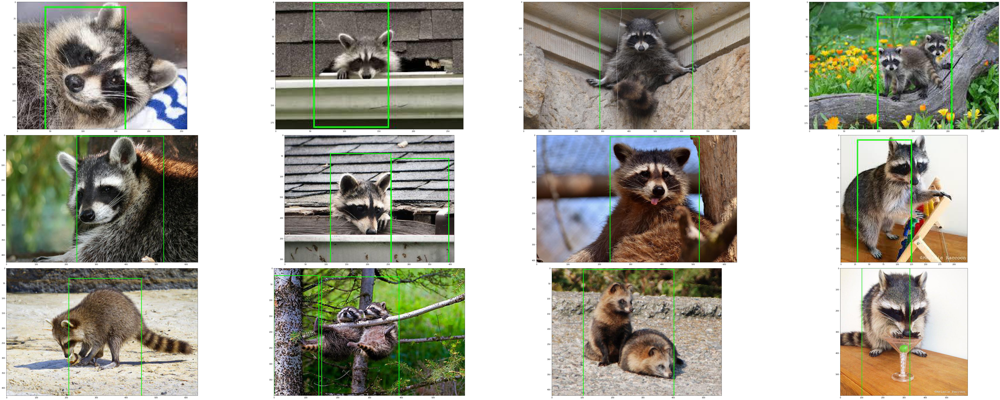

In [42]:
# Visualizing the first 12 images.
OUTPUT_PATH = 'tlt_infer_testing/images_annotated' # relative path from $USER_EXPERIMENT_DIR.
COLS = 4 # number of columns in the visualizer grid.
IMAGES = 12 # number of images to visualize.

visualize_images(OUTPUT_PATH, num_cols=COLS, num_images=IMAGES)

## 10. Model Export <a class="anchor" id="head-10"></a>

In [43]:
!mkdir -p $LOCAL_EXPERIMENT_DIR/experiment_dir_final
# Removing a pre-existing copy of the etlt if there has been any.
import os
output_file=os.path.join(os.environ['LOCAL_EXPERIMENT_DIR'],
                         "experiment_dir_final/resnet18_detector.etlt")
if os.path.exists(output_file):
    os.system("rm {}".format(output_file))
!tao detectnet_v2 export \
                  -m $USER_EXPERIMENT_DIR/experiment_dir_retrain/weights/resnet18_detector_pruned.tlt \
                  -o $USER_EXPERIMENT_DIR/experiment_dir_final/resnet18_detector.etlt \
                  -k $KEY

2022-01-11 10:16:08,080 [INFO] root: Registry: ['nvcr.io']
2022-01-11 10:16:08,119 [INFO] tlt.components.instance_handler.local_instance: Running command in container: nvcr.io/nvidia/tao/tao-toolkit-tf:v3.21.11-tf1.15.4-py3
2022-01-11 10:16:08,149 [WARNING] tlt.components.docker_handler.docker_handler: 
Docker will run the commands as root. If you would like to retain your
local host permissions, please add the "user":"UID:GID" in the
DockerOptions portion of the "/home/demo/.tao_mounts.json" file. You can obtain your
users UID and GID by using the "id -u" and "id -g" commands on the
terminal.
Using TensorFlow backend.
Using TensorFlow backend.
2022-01-11 01:16:12,884 [INFO] root: Building exporter object.
2022-01-11 01:16:14,323 [INFO] root: Exporting the model.
2022-01-11 01:16:14,324 [INFO] root: Using input nodes: ['input_1']
2022-01-11 01:16:14,324 [INFO] root: Using output nodes: ['output_cov/Sigmoid', 'output_bbox/BiasAdd']
2022-01-11 01:16:14,324 [INFO] iva.common.export.keras_

In [44]:
print('Exported model:')
print('------------')
!ls -lh $LOCAL_EXPERIMENT_DIR/experiment_dir_final

Exported model:
------------
total 43M
-rw-r--r-- 1 root root 43M  1월 11 10:16 resnet18_detector.etlt


### A. Int8 Optimization <a class="anchor" id="head-10-1"></a>
DetectNet_v2 model supports int8 inference mode in TensorRT. 
In order to use int8 mode, we must calibrate the model to run 8-bit inferences -

* Generate calibration tensorfile from the training data using detectnet_v2 calibration_tensorfile
* Use tao <task> export to generate int8 calibration table.

*Note: For this example, we generate a calibration tensorfile containing 10 batches of training data.
Ideally, it is best to use at least 10-20% of the training data to do so. The more data provided during calibration, the closer int8 inferences are to fp32 inferences.*

*Note: If the model was trained with QAT nodes available, please refrain from using the post training int8 optimization as mentioned below. Please export the model in int8 mode (using the arg `--data_type int8`) with just the path to the calibration cache file (using the argument `--cal_cache_file`)*

In [45]:
!tao detectnet_v2 calibration_tensorfile -e $SPECS_DIR/detectnet_v2_retrain_resnet18_kitti.txt \
                                         -m 10 \
                                         -o $USER_EXPERIMENT_DIR/experiment_dir_final/calibration.tensor

2022-01-11 10:17:17,069 [INFO] root: Registry: ['nvcr.io']
2022-01-11 10:17:17,109 [INFO] tlt.components.instance_handler.local_instance: Running command in container: nvcr.io/nvidia/tao/tao-toolkit-tf:v3.21.11-tf1.15.4-py3
2022-01-11 10:17:17,135 [WARNING] tlt.components.docker_handler.docker_handler: 
Docker will run the commands as root. If you would like to retain your
local host permissions, please add the "user":"UID:GID" in the
DockerOptions portion of the "/home/demo/.tao_mounts.json" file. You can obtain your
users UID and GID by using the "id -u" and "id -g" commands on the
terminal.
Using TensorFlow backend.
Using TensorFlow backend.
2022-01-11 01:17:21,515 [INFO] __main__: This method is soon to be deprecated. Please use the -e option in the export command to instantiate the dataloader and generate samples for calibration from the training dataloader.
2022-01-11 01:17:21,515 [INFO] iva.detectnet_v2.spec_handler.spec_loader: Merging specification from /workspace/tao-experime

Writing calibration tensorfile: 100%|███████████| 10/10 [00:02<00:00,  3.38it/s]
Time taken to run __main__:main: 0:00:03.556425.
2022-01-11 10:17:25,942 [INFO] tlt.components.docker_handler.docker_handler: Stopping container.


In [46]:
!rm -rf $LOCAL_EXPERIMENT_DIR/experiment_dir_final/resnet18_detector.etlt
!rm -rf $LOCAL_EXPERIMENT_DIR/experiment_dir_final/calibration.bin
!tao detectnet_v2 export \
                  -m $USER_EXPERIMENT_DIR/experiment_dir_retrain/weights/resnet18_detector_pruned.tlt \
                  -o $USER_EXPERIMENT_DIR/experiment_dir_final/resnet18_detector.etlt \
                  -k $KEY  \
                  --cal_data_file $USER_EXPERIMENT_DIR/experiment_dir_final/calibration.tensor \
                  --data_type int8 \
                  --batches 10 \
                  --batch_size 4 \
                  --max_batch_size 4\
                  --engine_file $USER_EXPERIMENT_DIR/experiment_dir_final/resnet18_detector.trt.int8 \
                  --cal_cache_file $USER_EXPERIMENT_DIR/experiment_dir_final/calibration.bin \
                  --verbose

2022-01-11 10:17:39,679 [INFO] root: Registry: ['nvcr.io']
2022-01-11 10:17:39,723 [INFO] tlt.components.instance_handler.local_instance: Running command in container: nvcr.io/nvidia/tao/tao-toolkit-tf:v3.21.11-tf1.15.4-py3
2022-01-11 10:17:39,750 [WARNING] tlt.components.docker_handler.docker_handler: 
Docker will run the commands as root. If you would like to retain your
local host permissions, please add the "user":"UID:GID" in the
DockerOptions portion of the "/home/demo/.tao_mounts.json" file. You can obtain your
users UID and GID by using the "id -u" and "id -g" commands on the
terminal.
Using TensorFlow backend.
Using TensorFlow backend.
2022-01-11 01:17:44,343 [INFO] root: Building exporter object.
2022-01-11 01:17:45,779 [INFO] root: Exporting the model.
2022-01-11 01:17:45,779 [INFO] root: Using input nodes: ['input_1']
2022-01-11 01:17:45,779 [INFO] root: Using output nodes: ['output_cov/Sigmoid', 'output_bbox/BiasAdd']
2022-01-11 01:17:45,779 [INFO] iva.common.export.keras_

### B. Generate TensorRT engine <a class="anchor" id="head-10-2"></a>
Verify engine generation using the `tao-converter` utility included with the docker.

The `tao-converter` produces optimized tensorrt engines for the platform that it resides on. Therefore, to get maximum performance, please instantiate this docker and execute the `tao-converter` command, with the exported `.etlt` file and calibration cache (for int8 mode) on your target device. The tao-converter utility included in this docker only works for x86 devices, with discrete NVIDIA GPU's. 

For the jetson devices, please download the tao-converter for jetson from the dev zone link [here](https://developer.nvidia.com/tao-converter). 

If you choose to integrate your model into deepstream directly, you may do so by simply copying the exported `.etlt` file along with the calibration cache to the target device and updating the spec file that configures the `gst-nvinfer` element to point to this newly exported model. Usually this file is called `config_infer_primary.txt` for detection models and `config_infer_secondary_*.txt` for classification models.

In [ ]:
!tao converter $USER_EXPERIMENT_DIR/experiment_dir_final/resnet18_detector.etlt \
                   -k $KEY \
                    -c $USER_EXPERIMENT_DIR/experiment_dir_final/calibration.bin \
                   -o output_cov/Sigmoid,output_bbox/BiasAdd \
                   -d 3,384,1248 \
                   -i nchw \
                   -m 64 \
                   -t int8 \
                   -e $USER_EXPERIMENT_DIR/experiment_dir_final/resnet18_detector.trt \
                   -b 4

## 11. Verify Deployed Model <a class="anchor" id="head-11"></a>
Verify the exported model by visualizing inferences on TensorRT.
In addition to running inference on a `.tlt` model in [step 9](#head-9), the `inference` tool is also capable of consuming the converted `TensorRT engine` from [step 10.B](#head-10-2).

*If after int-8 calibration the accuracy of the int-8 inferences seem to degrade, it could be because the there wasn't enough data in the calibration tensorfile used to calibrate thee model or, the training data is not entirely representative of your test images, and the calibration maybe incorrect. Therefore, you may either regenerate the calibration tensorfile with more batches of the training data and recalibrate the model, or calibrate the model on a few images from the test set. This may be done using `--cal_image_dir` flag in the `export` tool. For more information, please follow the instructions in the USER GUIDE.

### A. Inference using TensorRT engine <a class="anchor" id="head-11-1"></a>

In [ ]:
!tao detectnet_v2 inference -e $SPECS_DIR/detectnet_v2_inference_kitti_etlt.txt \
                            -o $USER_EXPERIMENT_DIR/etlt_infer_testing \
                            -i $DATA_DOWNLOAD_DIR/testing/image_2 \
                            -k $KEY

In [ ]:
# visualize the first 12 inferenced images.
OUTPUT_PATH = 'etlt_infer_testing/images_annotated' # relative path from $USER_EXPERIMENT_DIR.
COLS = 4 # number of columns in the visualizer grid.
IMAGES = 12 # number of images to visualize.

visualize_images(OUTPUT_PATH, num_cols=COLS, num_images=IMAGES)

## 11. QAT workflow <a class="anchor" id="head-12"></a>
This section delves into the newly enabled Quantization Aware Training feature with DetectNet_v2. The workflow defined below converts a pruned model from section [5](#head-5) to enable QAT and retrain this model to while accounting the noise introduced due to quantization in the forward pass. 

### A. Convert pruned model to QAT and retrain <a class="anchor" id="head-12-1"></a>
All detectnet models, unpruned and pruned models can be converted to QAT models by setting the `enable_qat` parameter in the `training_config` component of the spec file to `true`.

In [ ]:
# Printing the retrain experiment file. 
# Note: We have updated the experiment file to convert the
# pretrained model to qat mode by setting the enable_qat
# parameter.
!cat $LOCAL_SPECS_DIR/detectnet_v2_retrain_resnet18_kitti_qat.txt

In [ ]:
!tao detectnet_v2 train -e $SPECS_DIR/detectnet_v2_retrain_resnet18_kitti_qat.txt \
                        -r $USER_EXPERIMENT_DIR/experiment_dir_retrain_qat \
                        -k $KEY \
                        -n resnet18_detector_pruned_qat \
                        --gpus $NUM_GPUS

In [ ]:
!ls -rlt $LOCAL_EXPERIMENT_DIR/experiment_dir_retrain_qat/weights

### B. Evaluate QAT converted model <a class="anchor" id="head-12-2"></a>
This section evaluates a QAT enabled pruned retrained model. The mAP of this model should be comparable to that of the pruned retrained model without QAT. However, due to quantization, it is possible sometimes to see a drop in the mAP value for certain datasets.

In [ ]:
!tao detectnet_v2 evaluate -e $SPECS_DIR/detectnet_v2_retrain_resnet18_kitti_qat.txt \
                           -m $USER_EXPERIMENT_DIR/experiment_dir_retrain_qat/weights/resnet18_detector_pruned_qat.tlt \
                           -k $KEY \
                           -f tlt

### C. Export QAT trained model to int8 <a class="anchor" id="head-12-3"></a>
Export a QAT trained model to TensorRT parsable model. This command generates an .etlt file from the trained model and the serializes corresponding int8 scales as a TRT readable calibration cache file.

In [ ]:
!rm -rf $LOCAL_EXPERIMENT_DIR/experiment_dir_final/resnet18_detector_qat.etlt
!rm -rf $LOCAL_EXPERIMENT_DIR/experiment_dir_final/calibration_qat.bin
!tao detectnet_v2 export \
                  -m $USER_EXPERIMENT_DIR/experiment_dir_retrain_qat/weights/resnet18_detector_pruned_qat.tlt \
                  -o $USER_EXPERIMENT_DIR/experiment_dir_final/resnet18_detector_qat.etlt \
                  -k $KEY  \
                  --data_type int8 \
                  --batch_size 64 \
                  --max_batch_size 64\
                  --engine_file $USER_EXPERIMENT_DIR/experiment_dir_final/resnet18_detector_qat.trt.int8 \
                  --cal_cache_file $USER_EXPERIMENT_DIR/experiment_dir_final/calibration_qat.bin \
                  --verbose

### D. Evaluate a QAT trained model using the exported TensorRT engine <a class="anchor" id="head-12-4"></a>
This section evaluates a QAT enabled pruned retrained model using the TensorRT int8 engine that was exported in [Section C](#head-12-3). Please note that there maybe a slight difference (~0.1-0.5%) in the mAP from [Section B](#head-12-2), oweing to some differences in the implementation of quantization in TensorRT.

*Note: The TensorRT evaluator might be slightly slower than the TAO evaluator here, because the evaluation dataloader is pinned to the CPU to avoid any clashes between TensorRT and TAO instances in the GPU. Please note that this tool was not intended and has not been developed for profiling the model. It is just a means to qualitatively analyse the model.*

*Please use native TensorRT or DeepStream for the most optimized inferences.*

In [ ]:
!tao detectnet_v2 evaluate -e $SPECS_DIR/detectnet_v2_retrain_resnet18_kitti_qat.txt \
                           -m $USER_EXPERIMENT_DIR/experiment_dir_final/resnet18_detector_qat.trt.int8 \
                           -f tensorrt

### E. Inference using QAT engine <a class="anchor" id="head-12-5"></a>
Run inference and visualize detections on test images, using the exported TensorRT engine from [Section C](#head-12-3).

In [ ]:
!tao detectnet_v2 inference -e $SPECS_DIR/detectnet_v2_inference_kitti_etlt_qat.txt \
                            -o $USER_EXPERIMENT_DIR/tlt_infer_testing_qat \
                            -i $DATA_DOWNLOAD_DIR/testing/image_2 \
                            -k $KEY

In [ ]:
# visualize the first 12 inferenced images.
OUTPUT_PATH = 'tlt_infer_testing_qat/images_annotated' # relative path from $USER_EXPERIMENT_DIR.
COLS = 4 # number of columns in the visualizer grid.
IMAGES = 12 # number of images to visualize.

visualize_images(OUTPUT_PATH, num_cols=COLS, num_images=IMAGES)